# <b><u> Project Title : Seoul Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### In many urban cities, rental bikes have been introduced to improve the convenience of mobility. To ensure the smooth functioning of this service, it's essential that bikes are available and accessible to the public at the right time, reducing waiting times. Ensuring a consistent and reliable supply of rental bikes has become a significant challenge. The key issue is predicting the number of bikes needed each hour to maintain a stable supply for public use.

## <b> Data Description </b>

### The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - Non Functional Day, Functional hours (The company is functionong or not)

In [1]:
# importing important libraries
import pandas as pd
import numpy as np
from save_load_model import *
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
file_path='data.csv'

In [3]:
# Reading CSV file. 
bike_df=pd.read_csv(file_path,encoding="latin")

ERROR IN THE ENCODING,IF WE REMOVE THE ENCODING: specifies the character encoding used to read the file.

# *Data Exploration And Data Cleaning*

In [4]:
# Check 1st Five rows
bike_df.head(100)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,04/12/2017,248,23,-5.8,44,2.4,2000,-16.1,0.0,0.0,0.0,Winter,No Holiday,Yes
96,05/12/2017,216,0,-6.1,42,2.6,2000,-16.9,0.0,0.0,0.0,Winter,No Holiday,Yes
97,05/12/2017,198,1,-6.5,41,2.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
98,05/12/2017,124,2,-6.8,41,2.5,2000,-17.8,0.0,0.0,0.0,Winter,No Holiday,Yes


In [5]:
# Check last 5 rows
bike_df.tail(5)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [6]:
# Check Total rows and Columns in dataset.
# Rows= 8760
# Columns=14
print(f'The shape of dataset is {(bike_df.shape)}')
print(f'Total Rows are : {(bike_df.shape)[0]}')
print(f'Total Columns are : {(bike_df.shape)[1]}')

The shape of dataset is (8760, 14)
Total Rows are : 8760
Total Columns are : 14


In [7]:
# Check the info of dataset to know the data types of columns or variable
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

***Observations*** 

1)Null values/missing values- 0.

2)Date- columns need to convert into proper data type.

3)Columns to convert into numeric(for modelling Purpose)
  * seasons
  * holiday
  * functioning day


4) Rename columns-
   * Temperature(°C)
   * Humidity(%)
   * Wind speed (m/s)
   * Visibility (10m)
   * Dew point temperature(°C)
   * Solar Radiation (MJ/m2)
   * Rainfall(mm)
   * Snowfall (cm)
   * Rented Bike Count,Functioning Day.
   
  Beacuse white spaces and variables having units in brackets  which makes difficult to copy variable name.

In [8]:
# Check columns
bike_df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [9]:
#Since the variables having units with name, renaming columns for better variable analysis.
bike_df.rename(columns={'Rented Bike Count':'Rented_Bike_Count','Temperature(°C)':'Temperature','Humidity(%)':'Humidity','Wind speed (m/s)':'Wind_speed',
                       'Visibility (10m)':'Visibility','Dew point temperature(°C)':'Dew_point_temperature', 'Solar Radiation (MJ/m2)':'Solar_Radiation',
                        'Rainfall(mm)':'Rainfall','Snowfall (cm)':'Snowfall','Functioning Day':'Functioning_Day'},inplace=True)

In [10]:
# Change The datatype of Date columns to extract Month ,Day , year for furthur analysis
bike_df['Date'] = pd.to_datetime(bike_df['Date'], dayfirst=True)
# converts the data colums into date time format with ns precision


In [11]:
# Creating new columns Month, Year ,Day
bike_df['Month']=bike_df['Date'].dt.month

bike_df['Day']=bike_df['Date'].dt.day_name()  

#dt.day_name() will give day names 
# dt.month will give month numbers as 1,2,3,...12 

In [12]:
def week_daay_end(s):
	if s=='Saturday' or s=='Sunday':
		return 1
	else:
		return 0
#   Creating new column and Encoding with 1 if its weekend and 0 if its Weekdays.
bike_df['Weekdays_or_weekend']=bike_df['Day'].apply(week_daay_end)

In [13]:
# Adding lag features to capture autocorrelation
bike_df['lag_1'] = bike_df['Rented_Bike_Count'].shift(1)
bike_df['lag_2'] = bike_df['Rented_Bike_Count'].shift(2)

In [14]:
print(bike_df['lag_1'])
print(bike_df['lag_2'])

0          NaN
1        254.0
2        204.0
3        173.0
4        107.0
         ...  
8755    1384.0
8756    1003.0
8757     764.0
8758     694.0
8759     712.0
Name: lag_1, Length: 8760, dtype: float64
0          NaN
1          NaN
2        254.0
3        204.0
4        173.0
         ...  
8755    1047.0
8756    1384.0
8757    1003.0
8758     764.0
8759     694.0
Name: lag_2, Length: 8760, dtype: float64


In [15]:
# Adding rolling features to capture trends
#bike_df['rolling_mean_3'] = bike_df['Rented_Bike_Count'].rolling(window=3).mean()

In [16]:
# Ensure no data leakage by dropping rows with NaN values (from lagging/rolling)
bike_df.dropna(inplace=True)

In [17]:
#print(bike_df['rolling_mean_3'])

In [18]:
# Define time intervals
def categorize_time(hour):
    if 6 <= hour < 12:
        return 'Morning'  # 6 AM to 12 PM
    elif 12 <= hour < 17:
        return 'Afternoon'  # 12 PM to 5 PM
    elif 17 <= hour < 21:
        return 'Evening'  # 5 PM to 9 PM
    else:
        return 'Night'  # 9 PM to 6 AM

# Apply the function to create the new column
bike_df['Time_Interval'] = bike_df['Hour'].apply(categorize_time)

In [19]:
# Aggregate statistics for each time interval
time_interval_stats = bike_df.groupby('Time_Interval')['Rented_Bike_Count'].describe()
print(time_interval_stats)


                count         mean         std  min     25%     50%      75%  \
Time_Interval                                                                  
Afternoon      1825.0   790.264110  518.736906  0.0  319.00   769.0  1145.00   
Evening        1460.0  1226.386986  878.881128  0.0  378.75  1235.0  1958.25   
Morning        2190.0   613.988128  505.038038  0.0  211.00   534.0   901.75   
Night          3283.0   485.673165  518.143042  0.0  122.00   265.0   698.50   

                  max  
Time_Interval          
Afternoon      2479.0  
Evening        3556.0  
Morning        2495.0  
Night          2505.0  


# First interval (e.g., 6-9 AM)
    # First interval (e.g., 6-9 AM)
    # Second interval (e.g., 9 AM - 12 PM)
    # Third interval (e.g., 12-6 PM)
    # Fourth interval (e.g., 6 PM - 6 AM)

In [20]:
print(bike_df['Time_Interval'].unique())
time_interval_mapping = {
    'Morning': 0,   # First interval (e.g., 6-9 AM)
    'Afternoon': 1, # Second interval (e.g., 9 AM - 12 PM)
    'Evening': 2,   # Third interval (e.g., 12-6 PM)
    'Night': 3      # Fourth interval (e.g., 6 PM - 6 AM)
}

bike_df['Time_Interval'] = bike_df['Time_Interval'].map(time_interval_mapping)


['Night' 'Morning' 'Afternoon' 'Evening']


In [21]:
# Grouping by both Date and Time_Interval to aggregate the data
bike_df = bike_df.groupby(['Date', 'Time_Interval']).agg({
    'Rented_Bike_Count': 'sum',   # Sum of bike rentals for each Time_Interval on a given day
    'Temperature': 'mean',        # Mean temperature for each Time_Interval on a given day
    'Humidity': 'mean',
    'Wind_speed':'mean',           # Mean humidity for each Time_Interval on a given day
    'Visibility':'mean',           # Mean humidity for each Time_Interval on a given day
    'Dew_point_temperature':'mean',           # Mean humidity for each Time_Interval on a given day
    'Solar_Radiation':'mean',           # Mean humidity for each Time_Interval on a given day
    'Rainfall': 'sum',            # Sum of rainfall for each Time_Interval on a given day
    'Functioning_Day': 'first',   # Same for Functioning Day
    'Month': 'first',             # Same for the entire month
    'Weekdays_or_weekend': 'first',  # Same for the entire day
    'Seasons':'first',
    'Holiday':'first'    # Same for the entire day
}).reset_index()

# Now bike_df_aggregated has one row per Time_Interval (e.g., Morning, Afternoon, etc.) for each day


In [22]:
bike_df.head(5)

,Date,Time_Interval,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Functioning_Day,Month,Weekdays_or_weekend,Seasons,Holiday
0,2017-12-01,0,2760,-5.350000,30.333333,1.050000,1976.666667,-20.400000,0.305000,0.0,Yes,12,0,Winter,No Holiday
1,2017-12-01,1,2294,2.080000,32.800000,2.480000,1758.600000,-13.160000,0.812000,0.0,Yes,12,0,Winter,No Holiday
2,2017-12-01,2,2443,0.275000,70.000000,1.550000,1978.250000,-4.625000,0.020000,0.0,Yes,12,0,Winter,No Holiday
3,2017-12-01,3,1584,-3.942857,57.142857,1.285714,1761.714286,-11.885714,0.000000,0.0,Yes,12,0,Winter,No Holiday
4,2017-12-02,0,1485,-2.383333,69.333333,1.950000,1348.666667,-7.450000,0.351667,0.0,Yes,12,1,Winter,No Holiday


In [23]:
bike_df=bike_df.drop(["Date"],axis=1)

In [24]:
bike_df.head(5)

,Time_Interval,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Functioning_Day,Month,Weekdays_or_weekend,Seasons,Holiday
0,0,2760,-5.350000,30.333333,1.050000,1976.666667,-20.400000,0.305000,0.0,Yes,12,0,Winter,No Holiday
1,1,2294,2.080000,32.800000,2.480000,1758.600000,-13.160000,0.812000,0.0,Yes,12,0,Winter,No Holiday
2,2,2443,0.275000,70.000000,1.550000,1978.250000,-4.625000,0.020000,0.0,Yes,12,0,Winter,No Holiday
3,3,1584,-3.942857,57.142857,1.285714,1761.714286,-11.885714,0.000000,0.0,Yes,12,0,Winter,No Holiday
4,0,1485,-2.383333,69.333333,1.950000,1348.666667,-7.450000,0.351667,0.0,Yes,12,1,Winter,No Holiday


In [25]:
bike_df.tail(5)

,Time_Interval,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Functioning_Day,Month,Weekdays_or_weekend,Seasons,Holiday
1455,3,3826,2.377778,40.000000,1.100000,1740.777778,-10.288889,0.000000,0.0,Yes,11,0,Autumn,No Holiday
1456,0,4575,0.550000,59.500000,0.983333,1239.166667,-6.583333,0.476667,0.0,Yes,11,0,Autumn,No Holiday
1457,1,3826,7.140000,24.400000,2.220000,1837.200000,-12.140000,1.426000,0.0,Yes,11,0,Autumn,No Holiday
1458,2,4198,4.575000,33.500000,2.225000,1858.000000,-10.175000,0.057500,0.0,Yes,11,0,Autumn,No Holiday
1459,3,3698,1.000000,57.777778,0.944444,1545.888889,-6.666667,0.000000,0.0,Yes,11,0,Autumn,No Holiday


In [26]:
# Aggregate statistics for each time interval
time_interval_stats = bike_df.groupby('Time_Interval')['Rented_Bike_Count'].describe()
print(time_interval_stats)

               count         mean          std  min     25%     50%     75%  \
Time_Interval                                                                 
0              365.0  3683.928767  2373.817055  0.0  1641.0  3688.0  5723.0   
1              365.0  3951.320548  2484.573666  0.0  1670.0  3841.0  5874.0   
2              365.0  4905.547945  3344.717749  0.0  1585.0  5160.0  7802.0   
3              365.0  4368.397260  2836.795677  0.0  1559.0  4254.0  6975.0   

                   max  
Time_Interval           
0               8286.0  
1              10431.0  
2              11218.0  
3              10194.0  


In [27]:
print(bike_df['Time_Interval'].head())

0    0
1    1
2    2
3    3
4    0
Name: Time_Interval, dtype: int64


In [28]:
print(bike_df['Weekdays_or_weekend'])

0       0
1       0
2       0
3       0
4       1
       ..
1455    0
1456    0
1457    0
1458    0
1459    0
Name: Weekdays_or_weekend, Length: 1460, dtype: int64


In [29]:
# check the Newly Created columns
bike_df.head(2)

,Time_Interval,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Functioning_Day,Month,Weekdays_or_weekend,Seasons,Holiday
0,0,2760,-5.35,30.333333,1.05,1976.666667,-20.40,0.305,0.0,Yes,12,0,Winter,No Holiday
1,1,2294,2.08,32.800000,2.48,1758.600000,-13.16,0.812,0.0,Yes,12,0,Winter,No Holiday


In [30]:
#Get distinct categories counts for Seasons categories
bike_df['Seasons'].value_counts()

Seasons
Spring    368
Summer    368
Autumn    364
Winter    360
Name: count, dtype: int64

In [31]:
#Get distinct categories counts for Holiday categories
bike_df['Holiday'].value_counts()

Holiday
No Holiday    1388
Holiday         72
Name: count, dtype: int64

In [32]:
#Get distinct categories counts for Functioning_Day categories
bike_df['Functioning_Day'].value_counts()

Functioning_Day
Yes    1410
No       50
Name: count, dtype: int64

In [33]:
#Get distinct categories counts for for Month categories
bike_df['Month'].value_counts()

Month
12    124
1     124
3     124
5     124
7     124
8     124
10    124
4     120
6     120
9     120
11    120
2     112
Name: count, dtype: int64

In [34]:
#Get distinct categories counts for for Weekdays_or_weekend categories
bike_df['Weekdays_or_weekend'].value_counts()

Weekdays_or_weekend
0    1044
1     416
Name: count, dtype: int64

In [35]:
## Check the Summary of Bike data to egt mean,max,25%,50%,75% etc
bike_df.describe()

,Time_Interval,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Month,Weekdays_or_weekend
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,1.500000,4227.298630,13.421143,56.288876,1.831937,1452.960086,4.023441,0.665964,0.892123,6.526027,0.284932
std,1.118417,2820.937762,11.919034,18.868135,0.889998,551.604259,12.991747,0.793232,4.036035,3.449033,0.451536
min,0.000000,0.000000,-17.050000,12.800000,0.000000,114.500000,-29.850000,0.000000,0.000000,1.000000,0.000000
25%,0.750000,1589.750000,3.787500,41.787500,1.150000,1021.687500,-4.741111,0.000000,0.000000,4.000000,0.000000
50%,1.500000,4071.000000,14.419444,55.366667,1.644444,1644.433333,5.025000,0.360000,0.000000,7.000000,0.000000
75%,2.250000,6460.250000,23.000000,70.229167,2.380000,1960.350000,14.780000,0.988083,0.000000,10.000000,1.000000
max,3.000000,11218.000000,38.420000,98.000000,6.175000,2000.000000,25.660000,3.210000,43.500000,12.000000,1.000000


In [36]:
# check for Null values in our bike data
# as we can see we don't have any null values.
bike_df.isnull().sum()

Time_Interval            0
Rented_Bike_Count        0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Functioning_Day          0
Month                    0
Weekdays_or_weekend      0
Seasons                  0
Holiday                  0
dtype: int64

Text(0.5, 1.0, ' Visualising Missing Values')

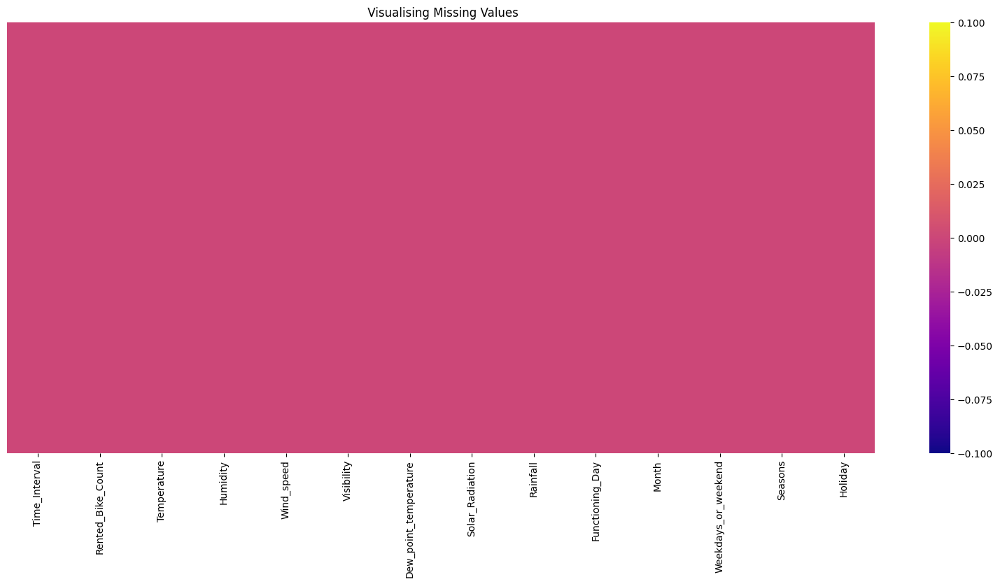

In [37]:
# Visulaizing null values using heatmap.
plt.figure(figsize=(20,8))
sns.heatmap(bike_df.isnull(),cmap='plasma',annot=False,yticklabels=False)
plt.title(" Visualising Missing Values")

No Null values found.

In [38]:
# checking Duplicate rows in our BikeData.
duplicates=bike_df.duplicated().sum()
print(f"We have {duplicates} duplicate rows in our Bike Data.")
# No duplicate rows found

We have 0 duplicate rows in our Bike Data.


# EDA

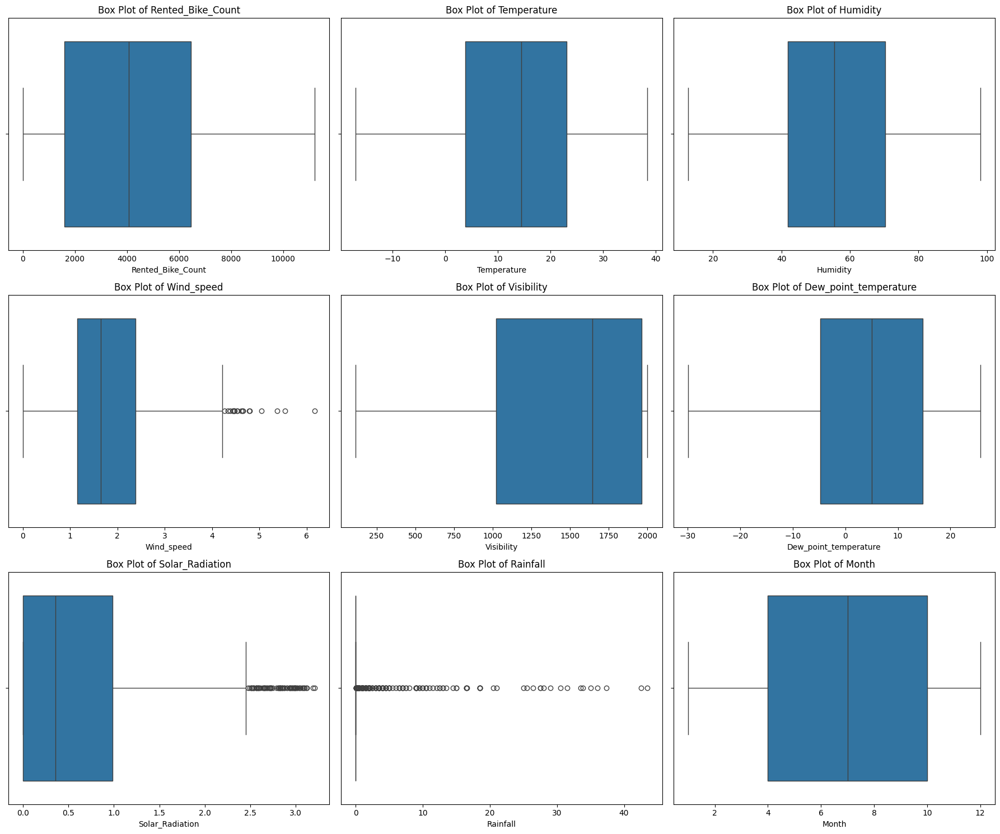

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create numeric columns list, excluding non-numeric features like 'Time_Interval'
numeric_col = bike_df.select_dtypes(include='number').columns.tolist()

# Check if 'Time_Interval' exists and remove it from numeric columns (if it's there)
if 'Time_Interval' in numeric_col:
    numeric_col.remove('Time_Interval')
    numeric_col.remove('Weekdays_or_weekend')

# Number of numeric columns
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plotting boxplots for each numeric column
for i, col in enumerate(numeric_col):
    sns.boxplot(x=bike_df[col], ax=axes[i])
    axes[i].set_title(f'Box Plot of {col}')

# Hide any unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout
plt.tight_layout()
plt.show()


/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/1211669433.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/1211669433.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/1211669433.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)  # Rotate x-axis labels for readability
/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/1211669433.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/var/folders/gy/15zg

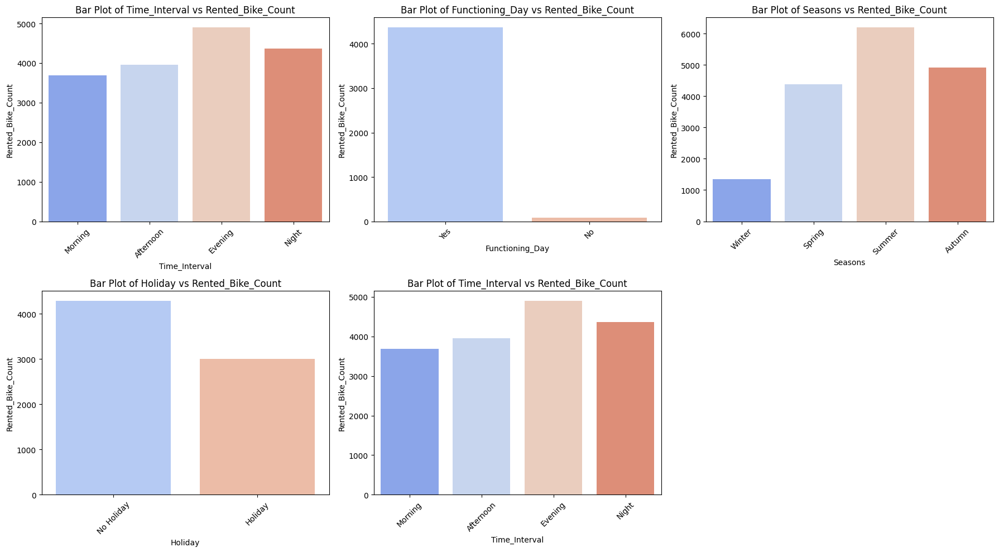

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure 'Time_Interval' is categorical and map labels for interpretability
if 'Time_Interval' in bike_df.columns:
    bike_df['Time_Interval'] = bike_df['Time_Interval'].astype('category')

time_interval_labels = {0: 'Morning', 1: 'Afternoon', 2: 'Evening', 3: 'Night'}
if 'Time_Interval' in bike_df.columns:
    bike_df['Time_Interval'] = bike_df['Time_Interval'].map(time_interval_labels)

# Create a list of categorical columns
categorical_columns = list(set(bike_df.columns) - set(bike_df.describe().columns))

# Add other explicitly known categorical variables
categorical_columns.extend(['Month', 'Weekdays_or_weekend', 'Time_Interval'])

# Ensure we are selecting only categorical columns that are not numeric
categorical_columns = [
    col for col in categorical_columns
    if col in bike_df.select_dtypes(exclude='number').columns or col == 'Time_Interval'
]

# Number of categorical columns
num_cats = len(categorical_columns)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cats // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Plotting bar charts for each categorical column
for i, col in enumerate(categorical_columns):
    sns.barplot(
        x=bike_df[col], 
        y=bike_df['Rented_Bike_Count'], 
        ci=None,  # Suppress confidence intervals for cleaner plots
        ax=axes[i],
        palette='coolwarm'  # Optional: Add a color palette for distinction
    )
    axes[i].set_title(f'Bar Plot of {col} vs Rented_Bike_Count')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Rented_Bike_Count')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)  # Rotate x-axis labels for readability

# Remove unused subplots, if any
for j in range(len(categorical_columns), len(axes)):
    axes[j].axis('off')

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()


**Observations From Above Barcharts:**

1) Summer season had the higest Bike Rent Count. People are more likely to rent bikes in summer. Bike rentals in winter is very less compared to other seasons.

2) High number of bikes were rented on No Holidays.

3) On no functioning day no bikes were rented. we have only 295 counts of "NO". Thus we can drop that 295 values but column having only 'Yes' will not add value to our column.So these columns is not use full for us. We can drop those.

4) Most of the bikes were rented on Weekdays compared to weekends.

5) From March Bike Rent Count started increasing and it was highest in June.

6) More bikes are sold out in Evening , then afternoon , then morning , and least in night 

### **Let's check Bike Rent Count trend with respect  to Time_Interval on Functioning days,weekends or weekdays,seasons,Holidays columns.**

/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/372357275.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(


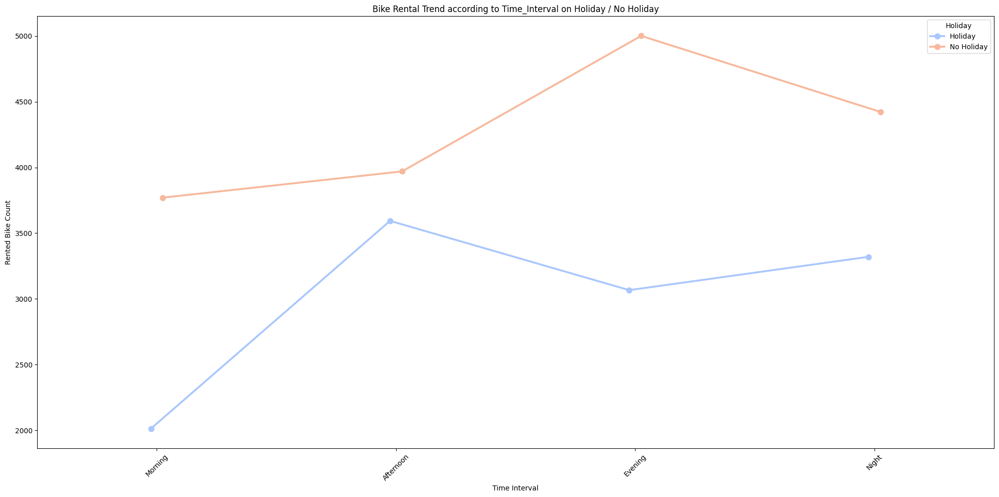

In [41]:
# Ensure 'Holiday' is treated as categorical (0 for no holiday, 1 for holiday)
bike_df['Holiday'] = bike_df['Holiday'].astype('category')

# Ensure 'Time_Interval' is treated as categorical if not already
bike_df['Time_Interval'] = bike_df['Time_Interval'].astype('category')

# Plotting the Bike Rental trend with respect to Time_Interval and Holiday
plt.figure(figsize=(20, 10))
sns.pointplot(
    x=bike_df['Time_Interval'], 
    y=bike_df['Rented_Bike_Count'],
    hue=bike_df['Holiday'],
    dodge=True,  # Avoid overlapping points
    ci=None,  # Optional: Remove confidence intervals for cleaner plot
    markers='o',  # Choose markers for points
    palette='coolwarm'  # Optional: Color palette to distinguish between Holiday and No Holiday
)

plt.title("Bike Rental Trend according to Time_Interval on Holiday / No Holiday")
plt.xlabel("Time Interval")  # Adding x-axis label
plt.ylabel("Rented Bike Count")  # Adding y-axis label
plt.xticks(rotation=45)  # Rotate x-axis labels for readability

plt.tight_layout()
plt.show()


## ***Observation***
 #### 1)There is little peak from Morning to early afternoon. Office time,College and going time could be the reason for this sudden peak ( NO Holiday).
 #### 2) Again there is suddenpeak between afternoon and evening . may be its office leaving time for the above people ( NO Holiday).

  But on Holiday the case is different  less bike rentals happend.


/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/380098485.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(


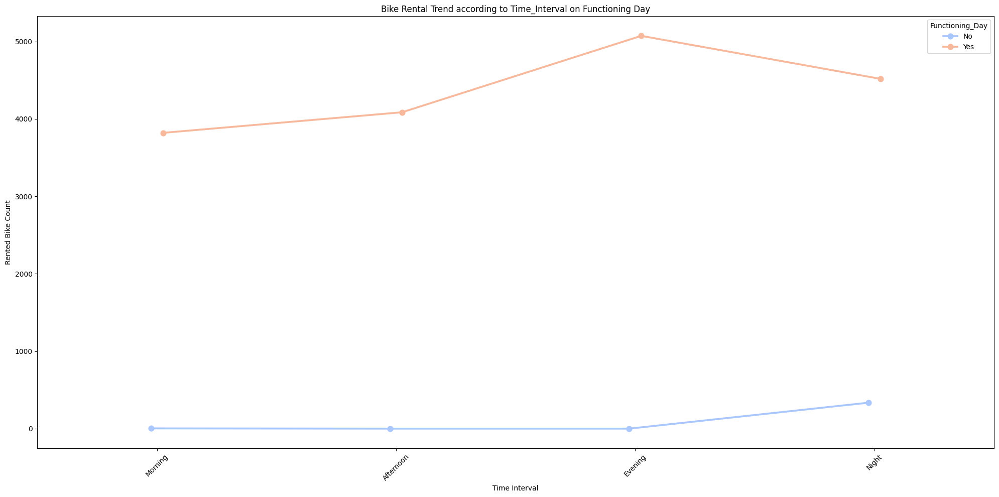

In [42]:
# Ensure 'Functioning_Day' is treated as categorical (0 for non-functioning day, 1 for functioning day)
bike_df['Functioning_Day'] = bike_df['Functioning_Day'].astype('category')

# Ensure 'Time_Interval' is treated as categorical (if not already)
bike_df['Time_Interval'] = bike_df['Time_Interval'].astype('category')

# Plotting the Bike Rental trend with respect to Time_Interval on Functioning Day
plt.figure(figsize=(20, 10))
sns.pointplot(
    x=bike_df['Time_Interval'], 
    y=bike_df['Rented_Bike_Count'],
    hue=bike_df['Functioning_Day'],
    dodge=True,  # Separate points for Functioning and Non-functioning Days
    ci=None,  # Optional: Remove confidence intervals for cleaner plot
    markers='o',  # Choose markers for points
    palette='coolwarm'  # Optional: Color palette to distinguish between Functioning and Non-functioning Days
)

# Adding plot title and axis labels
plt.title("Bike Rental Trend according to Time_Interval on Functioning Day")
plt.xlabel("Time Interval")  # Adding x-axis label
plt.ylabel("Rented Bike Count")  # Adding y-axis label
plt.xticks(rotation=45)  # Rotate x-axis labels for readability

# Display the plot with a tight layout
plt.tight_layout()
plt.show()


## ***Observation***
1) Here the trend for functioning day is same as of No holiday. Only the difference is on No functioning day there is no bike rentals.
(if we drop no fucntioning day rows. we will left only with the functioning day values.thus the column having same value through out will not be helpful.)

    ***So,its better to drop the column.***

/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/3115724242.py:14: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(
/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/3115724242.py:30: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(
/var/folders/gy/15zgzvcn79g_9hyyn4f35d_40000gn/T/ipykernel_45196/3115724242.py:46: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(


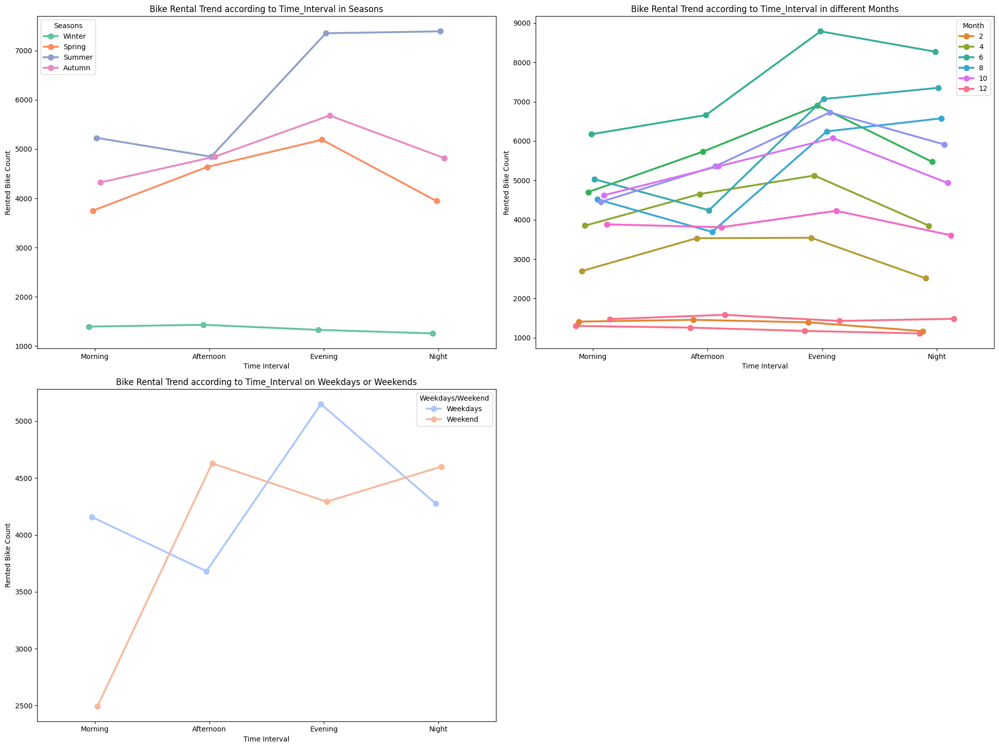

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure 'Time_Interval' is categorical
bike_df['Time_Interval'] = bike_df['Time_Interval'].astype('category')

# Create the subplots: 2 rows and 2 columns, with one empty subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))

# Flatten the axes for easier plotting
axes = axes.flatten()

# First plot: Bike Rent Count trend with respect to Time_Interval on Seasons
sns.pointplot(
    x='Time_Interval', 
    y='Rented_Bike_Count', 
    hue='Seasons', 
    data=bike_df, 
    ax=axes[0], 
    palette='Set2', 
    dodge=True,  # Separate points for different seasons
    ci=None  # Optional: Remove confidence intervals
)
axes[0].set_title("Bike Rental Trend according to Time_Interval in Seasons")
axes[0].set_xlabel("Time Interval")
axes[0].set_ylabel("Rented Bike Count")
axes[0].legend(title="Seasons", loc='best')

# Second plot: Bike Rent Count trend with respect to Time_Interval on Months
sns.pointplot(
    x='Time_Interval', 
    y='Rented_Bike_Count', 
    hue='Month', 
    data=bike_df, 
    ax=axes[1], 
    palette='husl', 
    dodge=True,  # Separate points for different months
    ci=None  # Optional: Remove confidence intervals
)
axes[1].set_title("Bike Rental Trend according to Time_Interval in different Months")
axes[1].set_xlabel("Time Interval")
axes[1].set_ylabel("Rented Bike Count")
axes[1].legend(title="Month", loc='best')

# Third plot: Bike Rent Count trend with respect to Time_Interval on Weekdays or Weekends
sns.pointplot(
    x='Time_Interval', 
    y='Rented_Bike_Count', 
    hue='Weekdays_or_weekend', 
    data=bike_df, 
    ax=axes[2], 
    palette='coolwarm', 
    dodge=True,  # Separate points for weekdays/weekends
    ci=None  # Optional: Remove confidence intervals
)
axes[2].set_title("Bike Rental Trend according to Time_Interval on Weekdays or Weekends")
axes[2].set_xlabel("Time Interval")
axes[2].set_ylabel("Rented Bike Count")
axes[2].legend(title="Weekdays/Weekend", labels=['Weekdays', 'Weekend'], loc='best')

# Remove the fourth empty subplot
fig.delaxes(axes[3])

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()


***The Observation Of these stick plots will be same as bar plots just maxima minima is used for more in depth inference of the data***

### It provides a comprehensive understanding of how each numeric variable interacts with ###
### Rented_Bike_Count across different Time_Interval values. ###
### Helps identify variables with strong or weak predictive power in specific time intervals. ###
### Useful for exploratory data analysis (EDA) to understand time-dependent patterns. ###

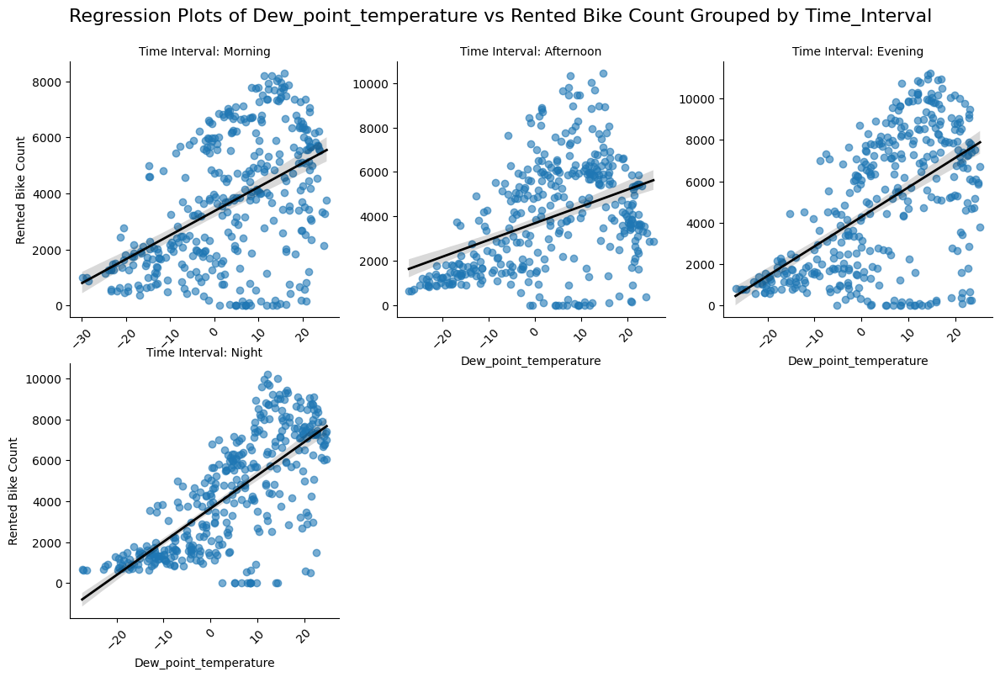

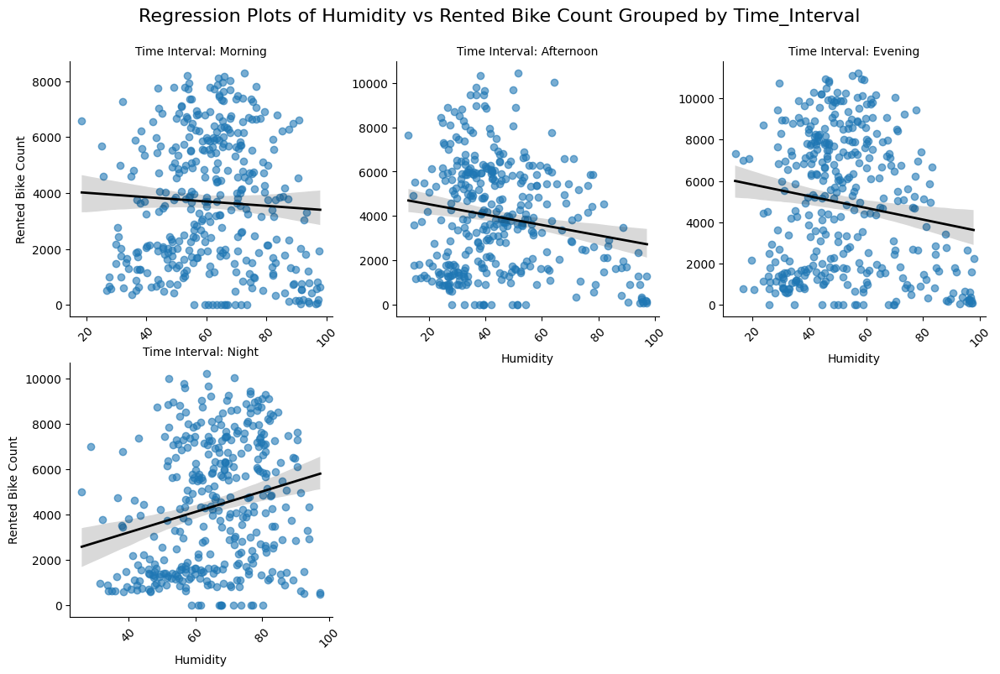

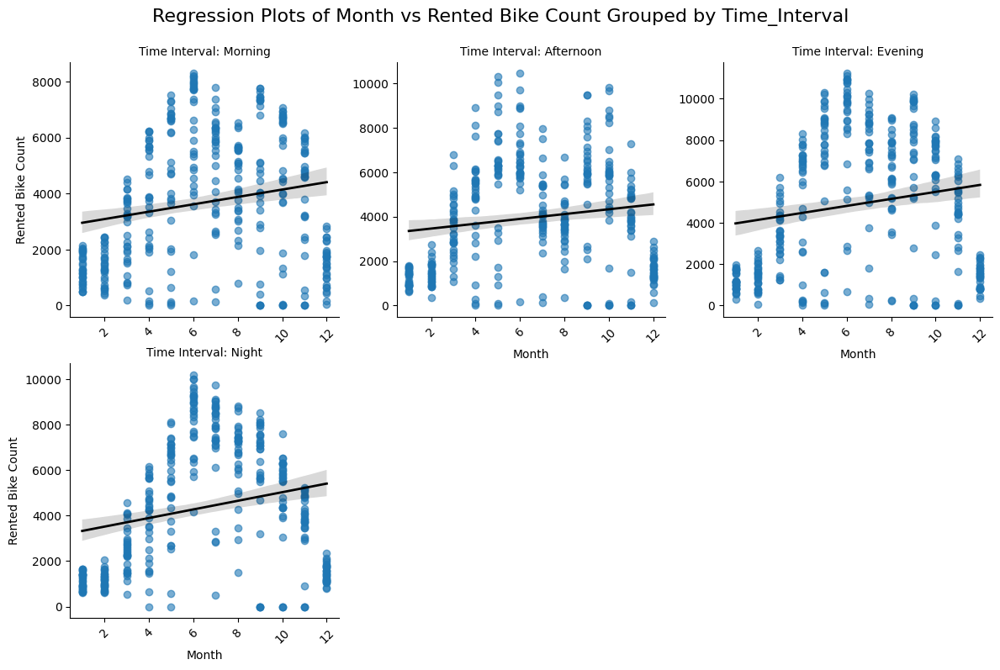

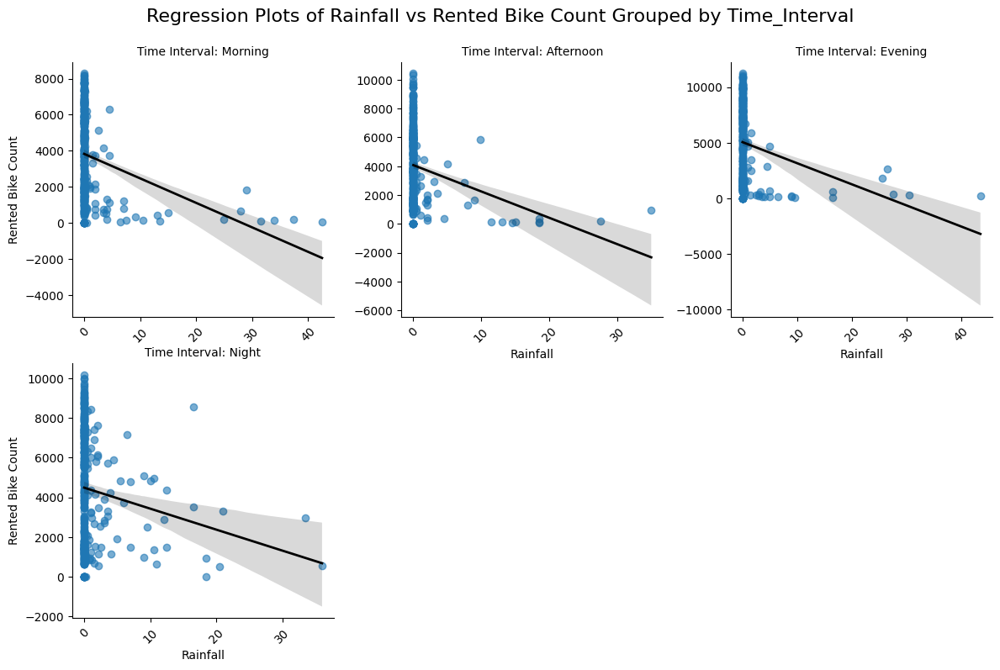

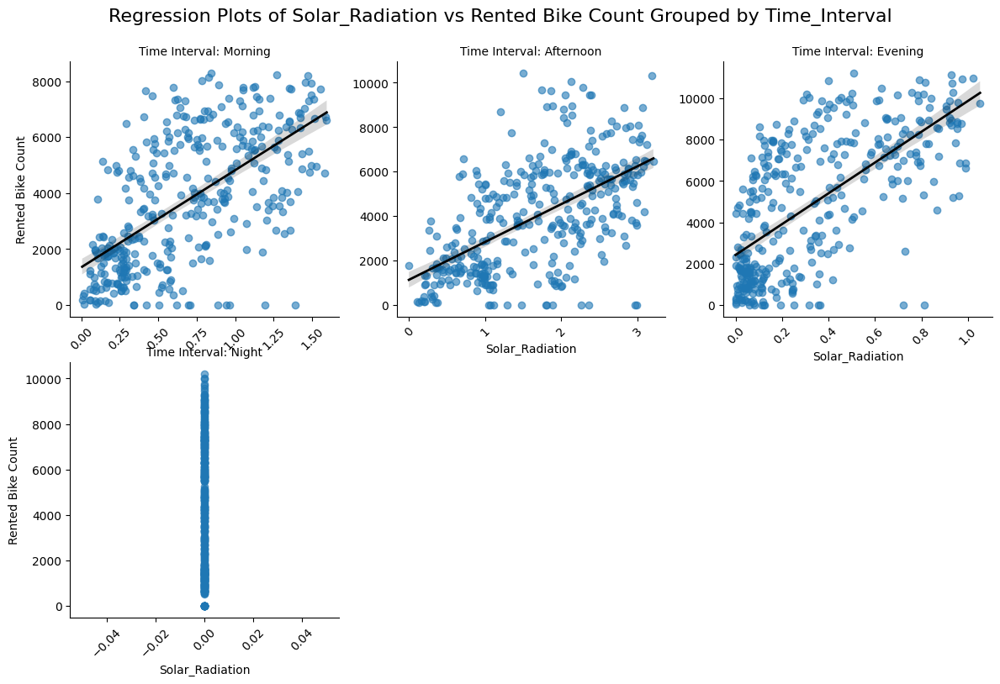

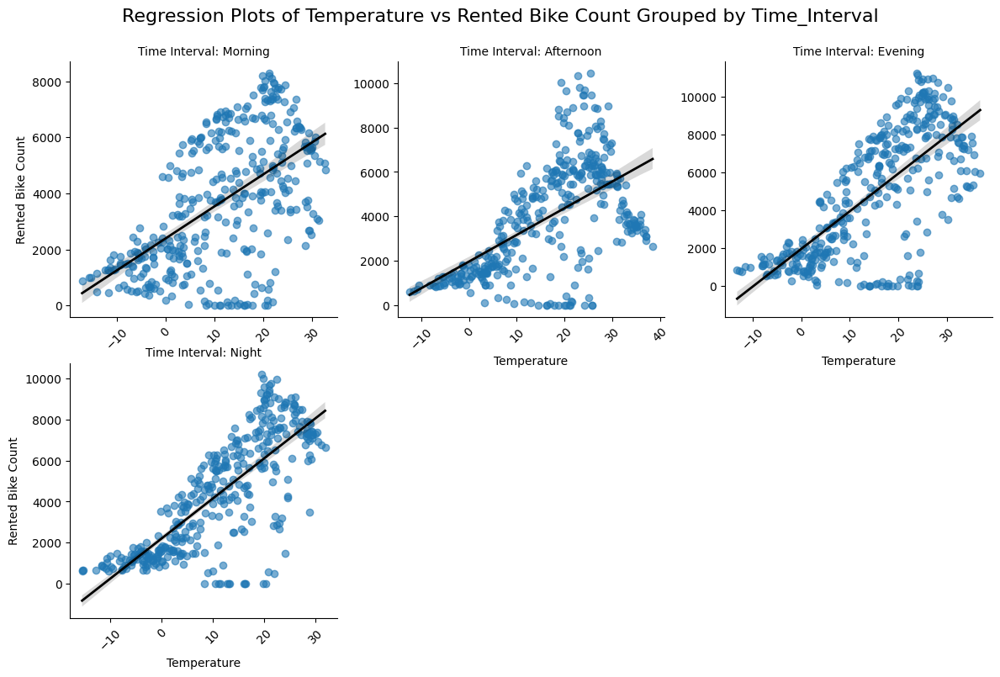

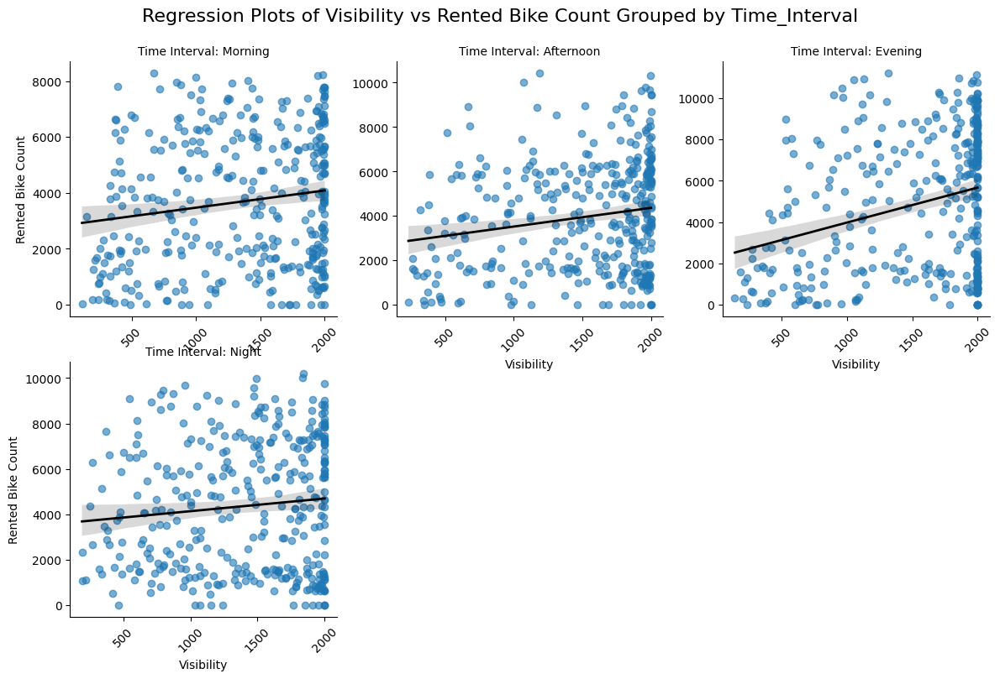

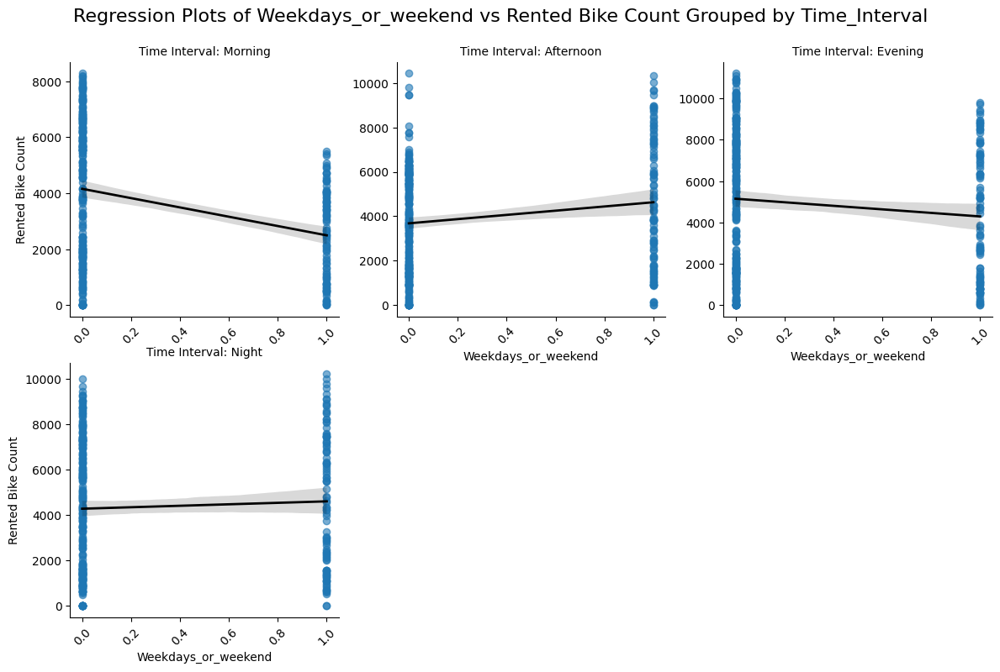

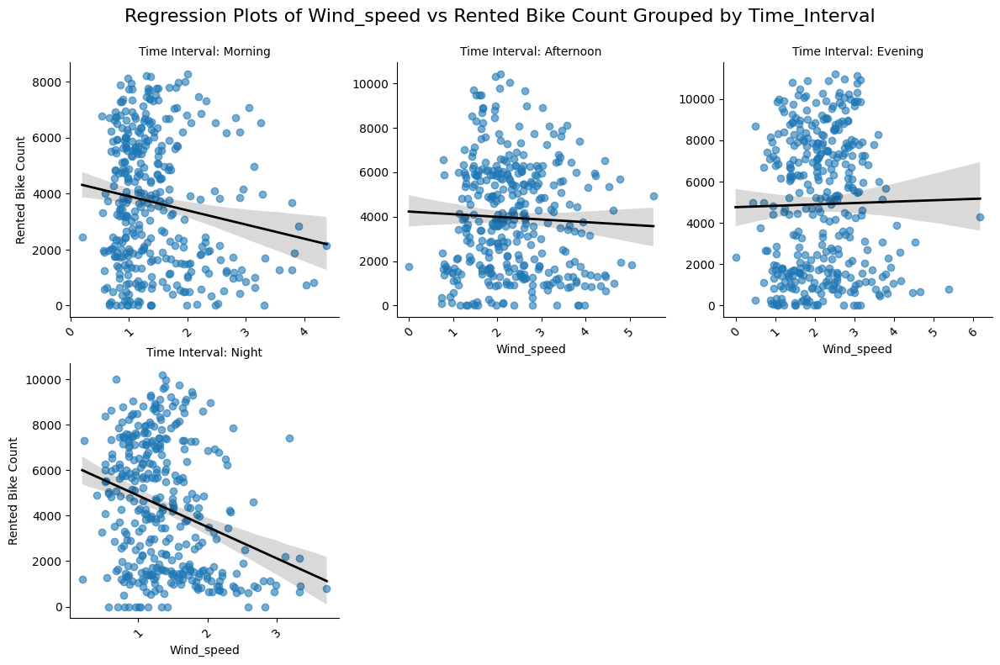

In [44]:
# List of numeric columns excluding the dependent variable
numeric_columns = bike_df.select_dtypes(include='number').columns.difference(['Rented_Bike_Count'])

# Loop through each numeric column to create faceted regression plots
for col in numeric_columns:
    g = sns.FacetGrid(bike_df, col='Time_Interval', col_wrap=3, height=4, sharex=False, sharey=False)
    g.map(sns.regplot, col, 'Rented_Bike_Count', scatter_kws={'alpha': 0.6}, line_kws={'color': 'black', 'linewidth': 2})
    
    # Correct the title formatting to dynamically use the column name
    g.set_titles("Time Interval: {col_name}")
    
    # Set axis labels and improve the title
    g.set_axis_labels(f"{col}", "Rented Bike Count")
    g.fig.suptitle(f"Regression Plots of {col} vs Rented Bike Count Grouped by Time_Interval", fontsize=16)
    
    # Adjust layout for a cleaner presentation
    g.fig.subplots_adjust(top=0.9)
    
    # Optionally, rotate x-axis labels to avoid overlap
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(45)
    
    # Display the plot
    plt.show()


### **Let's check distribution of target variable- "Bike Rented Count"**

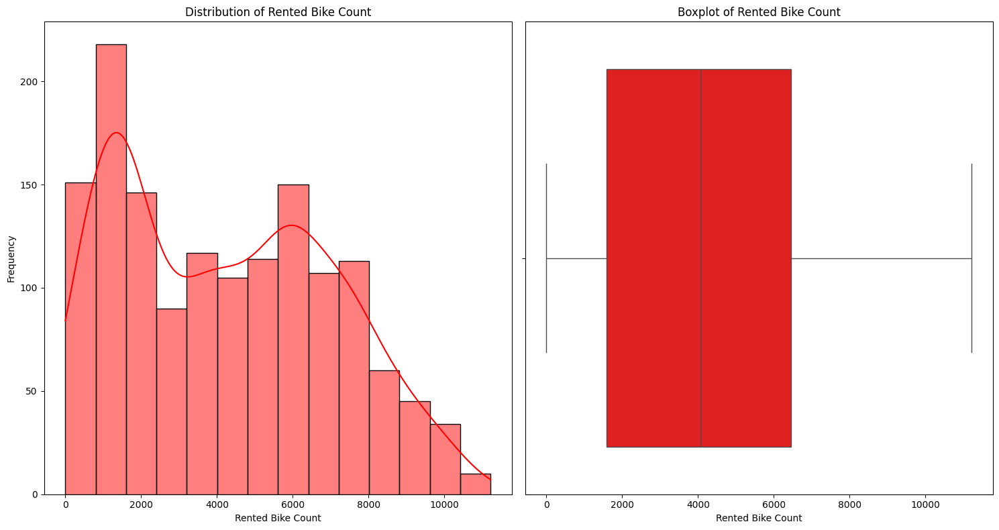

In [45]:
# Create subplots
f, axes = plt.subplots(1, 2, figsize=(15, 8))

# Plot the histogram with KDE
sns.histplot(bike_df['Rented_Bike_Count'], kde=True, color='red', ax=axes[0])
axes[0].set_title("Distribution of Rented Bike Count")
axes[0].set_xlabel("Rented Bike Count")
axes[0].set_ylabel("Frequency")

# Plot the boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='red', ax=axes[1])
axes[1].set_title("Boxplot of Rented Bike Count")
axes[1].set_xlabel("Rented Bike Count")

# Display the plots
plt.tight_layout()
plt.show()


**Our target varibale's distribution is slightly right skewed.**

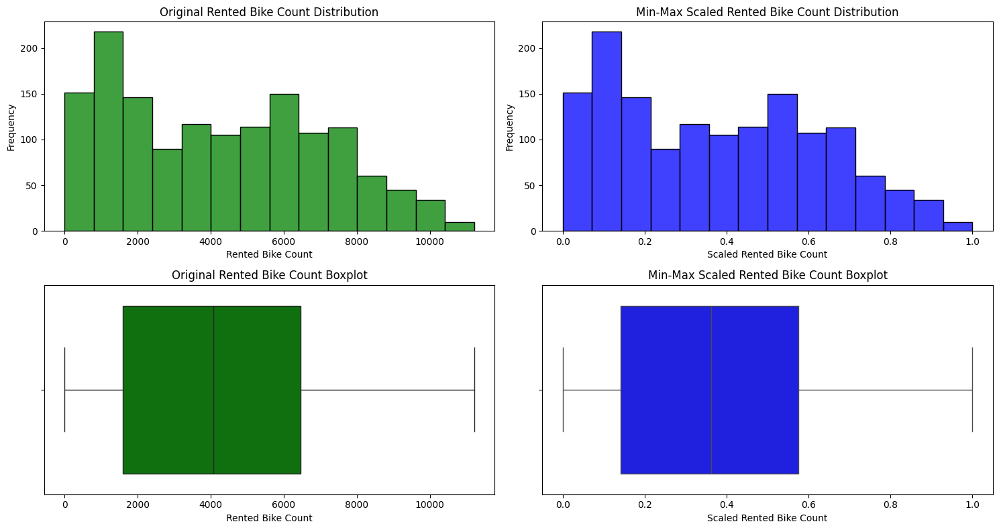

In [46]:
from sklearn.preprocessing import MinMaxScaler

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Reshape and scale 'Rented_Bike_Count'
rented_bike_count_scaled = scaler.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_scaled, columns=['Rented_Bike_Count_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], color='g', ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')
axes[0, 0].set_xlabel('Rented Bike Count')
axes[0, 0].set_ylabel('Frequency')

# Plot the scaled data histogram
sns.histplot(scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[0, 1])
axes[0, 1].set_title('Min-Max Scaled Rented Bike Count Distribution')
axes[0, 1].set_xlabel('Scaled Rented Bike Count')
axes[0, 1].set_ylabel('Frequency')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='g', ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')
axes[1, 0].set_xlabel('Rented Bike Count')

# Plot the scaled data boxplot
sns.boxplot(x=scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[1, 1])
axes[1, 1].set_title('Min-Max Scaled Rented Bike Count Boxplot')
axes[1, 1].set_xlabel('Scaled Rented Bike Count')

# Adjust layout
plt.tight_layout()
plt.show()


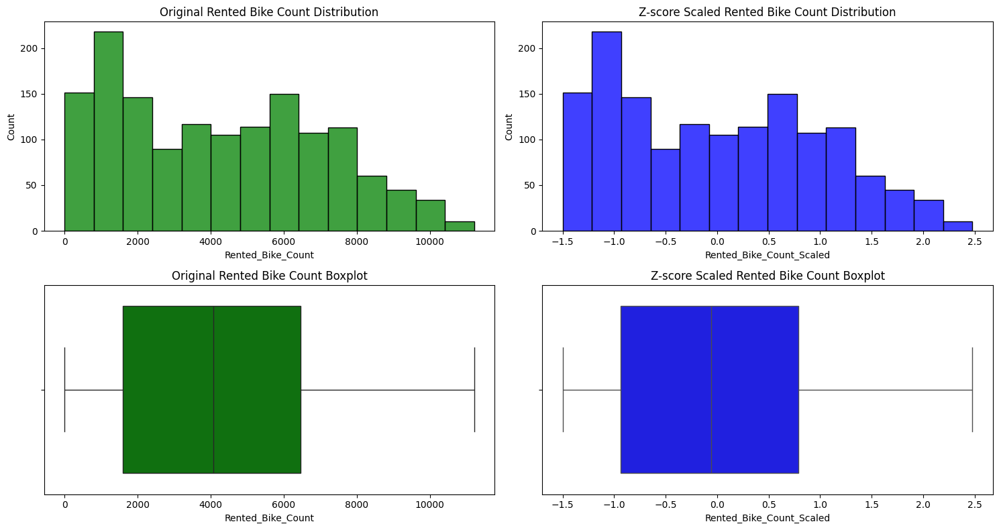

In [47]:
from sklearn.preprocessing import StandardScaler

# Assuming bike_df is your DataFrame and 'Rented_Bike_Count' is the target variable
scaler = StandardScaler()

# Reshape the data since StandardScaler expects a 2D array
rented_bike_count_scaled = scaler.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_scaled, columns=['Rented_Bike_Count_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], color='g', ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')

# Plot the scaled data histogram
sns.histplot(scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[0, 1])
axes[0, 1].set_title('Z-score Scaled Rented Bike Count Distribution')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='g', ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')

# Plot the scaled data boxplot
sns.boxplot(x=scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[1, 1])
axes[1, 1].set_title('Z-score Scaled Rented Bike Count Boxplot')

# Show the plots
plt.tight_layout()
plt.show()


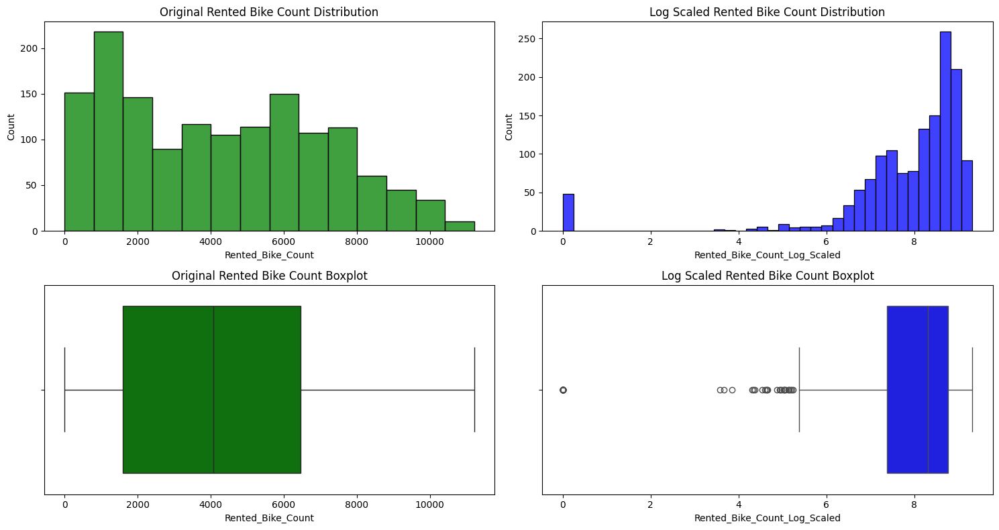

In [48]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import FunctionTransformer
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming bike_df is your DataFrame and 'Rented_Bike_Count' is the target variable

# Create a log transformer using FunctionTransformer
log_transformer = FunctionTransformer(np.log1p, validate=True)  # np.log1p is used for log(1+x)

# Reshape the data since FunctionTransformer expects a 2D array
rented_bike_count_log_scaled = log_transformer.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_log_scaled, columns=['Rented_Bike_Count_Log_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], color='g', ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')

# Plot the log-scaled data histogram
sns.histplot(scaled_df['Rented_Bike_Count_Log_Scaled'], color='b', ax=axes[0, 1])
axes[0, 1].set_title('Log Scaled Rented Bike Count Distribution')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='g', ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')

# Plot the log-scaled data boxplot
sns.boxplot(x=scaled_df['Rented_Bike_Count_Log_Scaled'], color='b', ax=axes[1, 1])
axes[1, 1].set_title('Log Scaled Rented Bike Count Boxplot')

# Show the plots
plt.tight_layout()
plt.show()


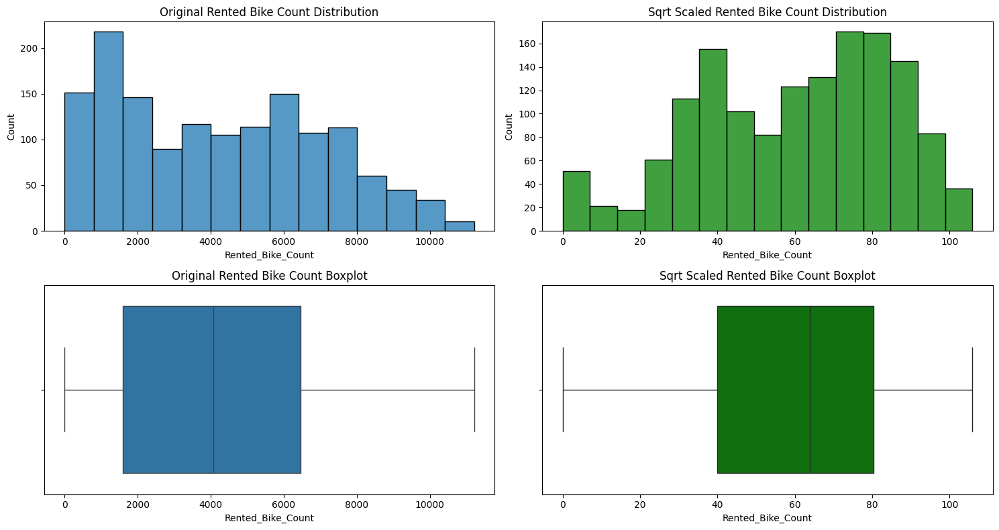

In [49]:
# Create a log transformer using FunctionTransformer
log_transformer = FunctionTransformer(np.log1p, validate=True)  # np.log1p is used for log(1+x)

# Reshape the data since FunctionTransformer expects a 2D array
rented_bike_count_log_scaled = log_transformer.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_log_scaled, columns=['Rented_Bike_Count_Log_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')

# Plot the sqrt-scaled data histogram
sns.histplot(x=np.sqrt(bike_df['Rented_Bike_Count']), color='g', ax=axes[0, 1])
axes[0, 1].set_title('Sqrt Scaled Rented Bike Count Distribution')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')

# Plot the sqrt-scaled data boxplot
sns.boxplot(x=np.sqrt(bike_df['Rented_Bike_Count']), color='g', ax=axes[1, 1])  # Fixed axis reference
axes[1, 1].set_title('Sqrt Scaled Rented Bike Count Boxplot')

# Show the plots
plt.tight_layout()
plt.show()


Thus we normalized our dependent variable and found the best scalar is square root method and also in boxplot we can see there are no outliers present.

## **Let's check distribution of independent variables**

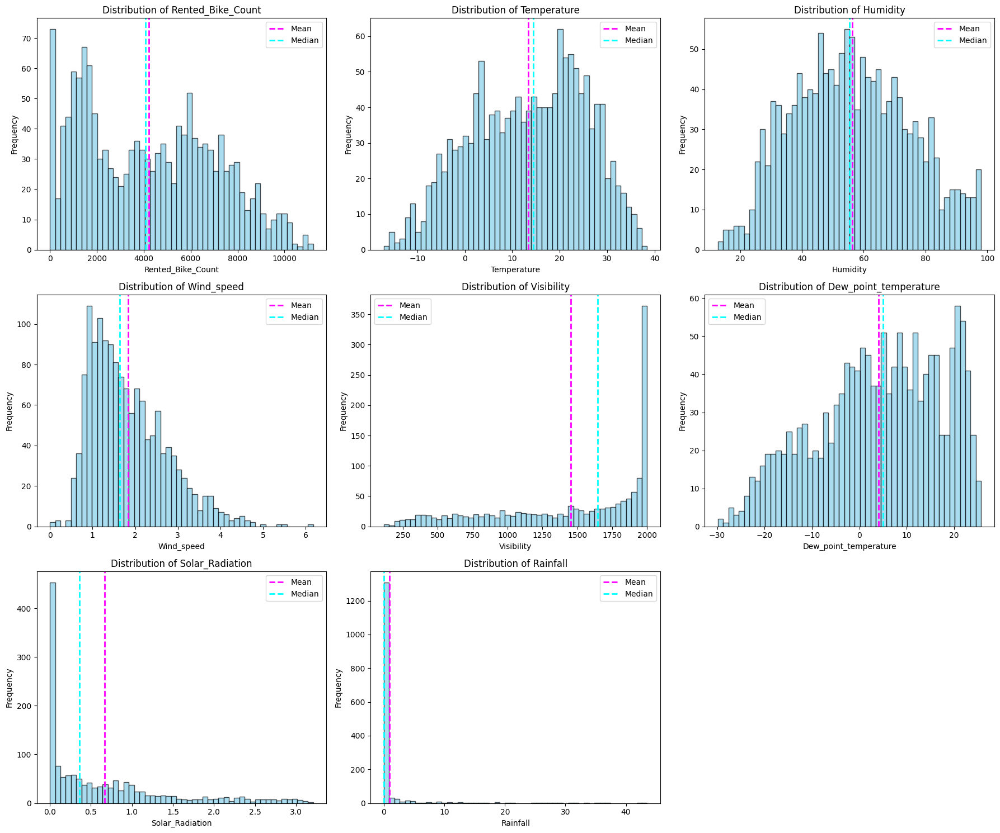

In [50]:
# Filter numeric columns to ensure only numeric types are included
numeric_col = bike_df.select_dtypes(include=['int64', 'float64']).columns.tolist()

if "Weekdays_or_weekend" in numeric_col:
    numeric_col.remove("Weekdays_or_weekend")

# Number of numeric columns
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Plotting histograms for each numeric column
for i, col in enumerate(numeric_col):
    feature = bike_df[col].dropna()  # Exclude NaN values

    # Skip plotting if feature is empty
    if feature.empty:
        continue

    bins = min(50, len(feature.unique()))  # Adjust bins dynamically, could also use a rule like sqrt(n)
    
    # Plot histogram
    axes[i].hist(feature, bins=bins, alpha=0.7, color='skyblue', edgecolor='black')
    
    # Plot mean and median lines
    axes[i].axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2, label='Mean')
    axes[i].axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2, label='Median')
    
    # Title and labels
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)  # Add x-axis label
    axes[i].set_ylabel('Frequency')  # Add y-axis label
    
    # Add legend and adjust its position to avoid overlap
    axes[i].legend(loc='best')

# Hide unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()


/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


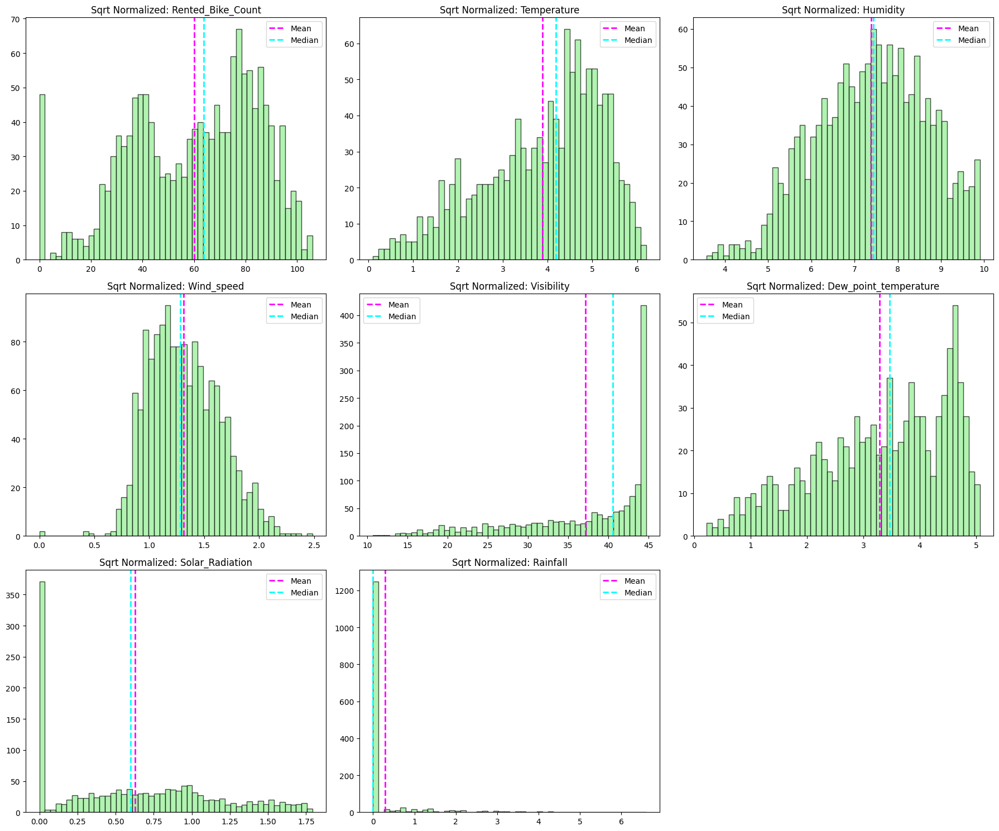

In [51]:
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Plotting histograms for the square root normalized variables
for i, col in enumerate(numeric_col):
    feature = np.sqrt(bike_df[col])  # Apply square root normalization
    axes[i].hist(feature, bins=50, alpha=0.7, color='lightgreen', edgecolor='black')
    axes[i].axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2, label='Mean')
    axes[i].axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2, label='Median')
    axes[i].set_title(f'Sqrt Normalized: {col}')
    axes[i].legend()

# Hide unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()



## **Check the relationship between all variables with each other variable**

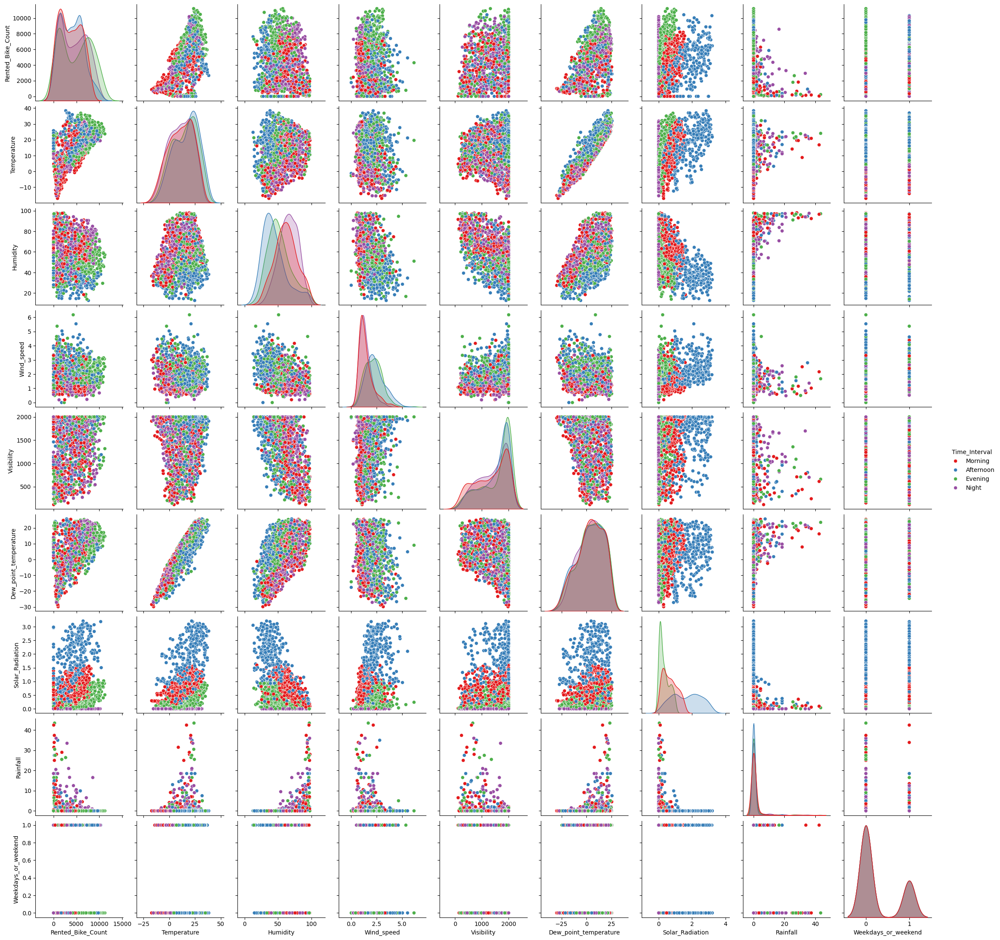

<Figure size 1500x1000 with 0 Axes>

In [52]:
# Filter only numeric columns to avoid errors
numeric_cols = bike_df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Ensure 'Time_Interval' is treated as categorical for hue
if 'Time_Interval' in numeric_cols:
    numeric_cols.remove('Time_Interval')  # Remove from numeric columns list
bike_df['Time_Interval'] = bike_df['Time_Interval'].astype('category')  # Ensure categorical type

# Optional: Exclude 'Rented_Bike_Count' if it's the target variable
# numeric_cols = [col for col in numeric_cols if col != 'Rented_Bike_Count']

# Create pairplot, coloring by 'Time_Interval'
sns.pairplot(bike_df[numeric_cols + ['Time_Interval']], hue='Time_Interval', palette='Set1')

# Adjust plot size and layout for better visualization
plt.figure(figsize=(15, 10))
plt.tight_layout()
plt.show()


## **Lets check the relationship between the dependent variable-"Rented Bike Count'and remaining columns(independent variable) In depth.**

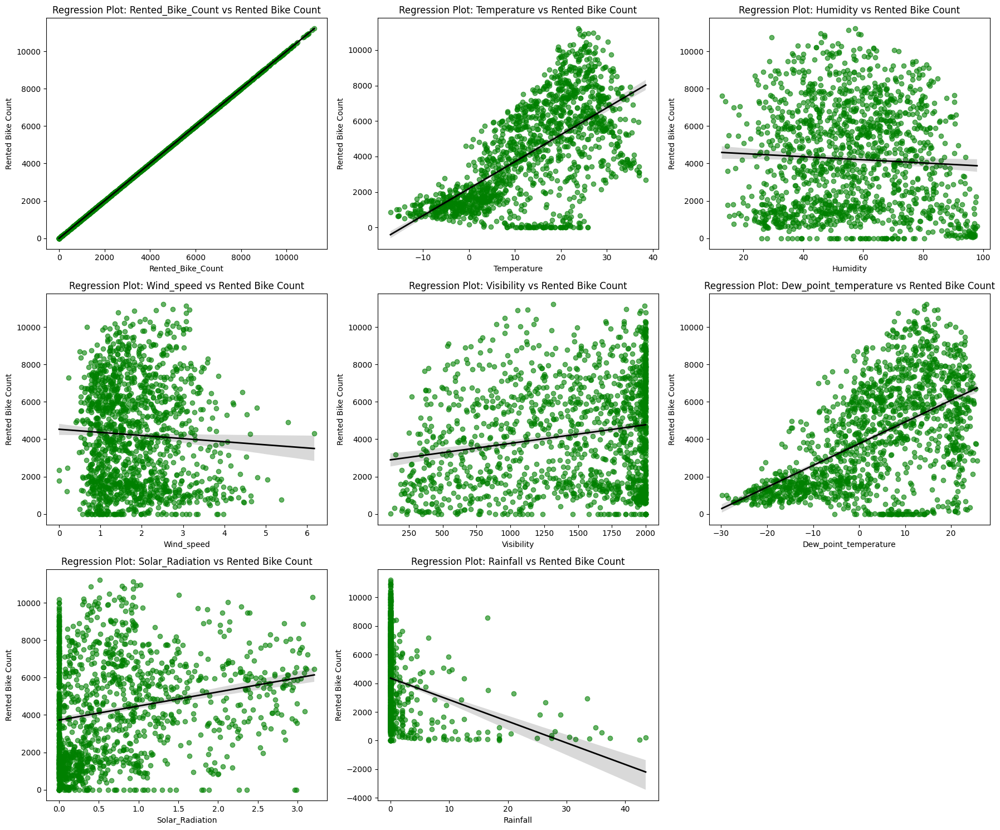

In [53]:
# Assuming 'numeric_col' has already been filtered to include only numeric columns
# and 'Time_Interval' is categorical

# Number of numeric columns
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Plotting regression plots for each numeric column
for i, col in enumerate(numeric_col):
    # Drop NaN values from the series
    x_data = bike_df[col].dropna()
    y_data = bike_df['Rented_Bike_Count'].dropna()

    # Ensure that both series have the same length after dropping NaNs
    min_len = min(len(x_data), len(y_data))
    x_data = x_data.iloc[:min_len]
    y_data = y_data.iloc[:min_len]

    # Plot the regression
    sns.regplot(
        x=x_data,  # Pass the x_data (1D series)
        y=y_data,  # Pass the y_data (1D series)
        scatter_kws={'color': 'green', 'alpha': 0.6},  # Improved scatter visibility
        line_kws={'color': 'black', 'linewidth': 2},   # Thicker regression line
        ax=axes[i]
    )
    axes[i].set_title(f'Regression Plot: {col} vs Rented Bike Count')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Rented Bike Count')

# Hide unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()


## **Checking Corelation between dependent and independent variable.**

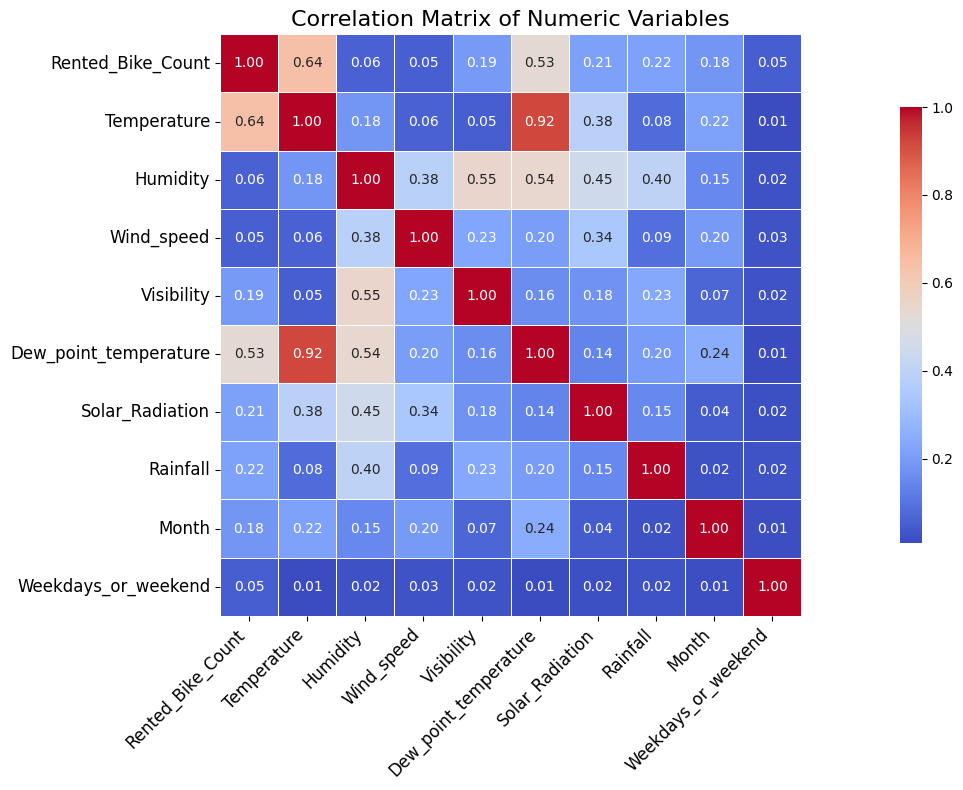

In [54]:
# Select only numeric columns for correlation
numeric_data = bike_df.select_dtypes(include=['number'])

# Optionally, encode 'Time_Interval' if you want to include it in the correlation
# If 'Time_Interval' is categorical, you can encode it before the correlation if you choose
# bike_df['Time_Interval'] = bike_df['Time_Interval'].astype('category').cat.codes  # Example: Label Encoding

# Compute the correlation matrix
corr = numeric_data.corr()

# Set up the figure size
plt.figure(figsize=(20, 8))

# Plot the heatmap
sns.heatmap(
    data=abs(corr),  # Show absolute correlations
    annot=True,  # Annotate the cells with correlation values
    cmap='coolwarm',  # Color map
    linewidths=0.5,  # Line width between cells
    cbar_kws={'shrink': 0.75},  # Adjust the color bar size
    annot_kws={'size': 10},  # Font size for annotations
    fmt='.2f',  # Format annotations to 2 decimal places
    square=True  # Make the heatmap square-shaped for better aesthetics
)

# Customize the plot title and axis labels
plt.title('Correlation Matrix of Numeric Variables', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better fit
plt.yticks(rotation=0, fontsize=12)  # Keep y-axis labels horizontal

# Adjust layout to prevent clipping of labels
plt.tight_layout()

# Display the plot
plt.show()


### Temperature and Dew point Temperature are highly correlated.

### As per our regression assumption, there should not be colinearity between independent variables.
### We can see from the heatmap that "Temperature" and "Dew Point Temperature" are highly corelated. We can drop one of them.As the corelation between temperature and our dependent variable "Bike Rented Count" is high. So we will Keep the Temperature column and drop the "Dew Point Temperature" column.
### And also we dropped "Date" column as its not useful for us(as we have created the month, weekdays and weekend columns.

In [55]:
# make copy of dataset

df=bike_df.copy()

# **Modeling**

## ***Feature Extraction***

In [56]:
df.head(1)

,Time_Interval,Rented_Bike_Count,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Functioning_Day,Month,Weekdays_or_weekend,Seasons,Holiday
0,Morning,2760,-5.35,30.333333,1.05,1976.666667,-20.4,0.305,0.0,Yes,12,0,Winter,No Holiday


In [57]:
# Since Temperature and Dew point temperature are corelated with each other. We will drop dew point temperature.
df.drop('Dew_point_temperature',inplace=True,axis=1)

In [58]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def Calculate_vif(X, scale=False):
    """
    Calculate Variance Inflation Factor (VIF) for each feature in the dataframe X.
    
    :param X: DataFrame or 2D array of features.
    :param scale: Boolean, whether to scale features before calculating VIF.
    
    :return: DataFrame with features and their corresponding VIF values.
    """
    if scale:
        # Standardize features to have mean=0 and variance=1 (optional but often recommended)
        scaler = StandardScaler()
        X = scaler.fit_transform(X)
    
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns if isinstance(X, pd.DataFrame) else [f'Feature {i+1}' for i in range(X.shape[1])]
    vif["VIF"] = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
    
    return vif


In [59]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count']]])

,variables,VIF
0,Temperature,3.390516
1,Humidity,6.980940
2,Wind_speed,5.899431
3,Visibility,6.655471
4,Solar_Radiation,2.833863
5,Rainfall,1.224724
6,Month,5.020328
7,Weekdays_or_weekend,1.381549


humidity vif is greater than 5 so we will remove that column. 

In [60]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count','Humidity']]])

,variables,VIF
0,Temperature,2.908054
1,Wind_speed,5.049522
2,Visibility,6.558211
3,Solar_Radiation,2.458081
4,Rainfall,1.111888
5,Month,4.008384
6,Weekdays_or_weekend,1.355782


Visiblity vif is greater than 5 so we will remove that column.

In [61]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count','Humidity','Visibility']]])

,variables,VIF
0,Temperature,2.852507
1,Wind_speed,3.217753
2,Solar_Radiation,2.457497
3,Rainfall,1.090429
4,Month,3.155136
5,Weekdays_or_weekend,1.347226


Now we have VIF values in the range of 1 to 5. we will drop 'Humidity','Visibility', these columns from our dataset.

In [62]:
# As per above vif calculation dropping humidity and visibility columns.
df.drop(['Humidity','Visibility'],inplace=True,axis=1)

In [63]:
# checking categoiries in season column.
df['Seasons'].value_counts()

Seasons
Spring    368
Summer    368
Autumn    364
Winter    360
Name: count, dtype: int64

In [64]:
# Createing dummy variables
df=pd.get_dummies(df,columns=['Seasons'],prefix='Seasons',drop_first=True)


In [65]:
# checking categoiries in holiday columns.
df['Holiday'].value_counts()

Holiday
No Holiday    1388
Holiday         72
Name: count, dtype: int64

In [66]:
# Labeling for holiday=1 and no holiday=0
df['Holiday']=df['Holiday'].map({'No Holiday':0, 'Holiday':1})

In [67]:
# # Labeling for Yes=1 and no No=0
df['Functioning_Day']=df['Functioning_Day'].map({'Yes':1, 'No':0})

In [68]:
# # Labeling for Yes=1 and no No=0
df['Time_Interval']=df['Time_Interval'].map({'Morning':0, 'Afternoon':1,'Evening':2,'Night':3})

In [69]:
# checking dummy and labled columns
df.head(3)


,Time_Interval,Rented_Bike_Count,Temperature,Wind_speed,Solar_Radiation,Rainfall,Functioning_Day,Month,Weekdays_or_weekend,Holiday,Seasons_Spring,Seasons_Summer,Seasons_Winter
0,0,2760,-5.350,1.05,0.305,0.0,1,12,0,0,False,False,True
1,1,2294,2.080,2.48,0.812,0.0,1,12,0,0,False,False,True
2,2,2443,0.275,1.55,0.020,0.0,1,12,0,0,False,False,True


In [70]:
# final info before going for modeling
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Time_Interval        1460 non-null   category
 1   Rented_Bike_Count    1460 non-null   int64   
 2   Temperature          1460 non-null   float64 
 3   Wind_speed           1460 non-null   float64 
 4   Solar_Radiation      1460 non-null   float64 
 5   Rainfall             1460 non-null   float64 
 6   Functioning_Day      1460 non-null   category
 7   Month                1460 non-null   int32   
 8   Weekdays_or_weekend  1460 non-null   int64   
 9   Holiday              1460 non-null   category
 10  Seasons_Spring       1460 non-null   bool    
 11  Seasons_Summer       1460 non-null   bool    
 12  Seasons_Winter       1460 non-null   bool    
dtypes: bool(3), category(3), float64(4), int32(1), int64(2)
memory usage: 83.3 KB


## ***Modeling***

In [71]:
# lets import train test split for splitting the data
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error

In [72]:
# Define X-variable(Independent Variables) and Y-Variable(Dependent Variable)
X=df.drop('Rented_Bike_Count',axis=1)
print(X.shape)
#As the best normalising technique is sqrt from the EDA
y=np.sqrt(df['Rented_Bike_Count'])

(1460, 12)


In [73]:
# Split data into train test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)


In [74]:
# Transforming data 
# Apply scaling to the linear regression models.
min_max_scaler = MinMaxScaler()
X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.transform(X_test)
print(min_max_scaler.scale_)
save_scaler(min_max_scaler,"scaler.pkl")

[0.33333333 0.01849454 0.18050542 0.32113038 0.02298851 1.
 0.09090909 1.         1.         1.         1.         1.        ]
Scaler saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/scalers/scaler.pkl


In [75]:
print(X_train.shape)
print(X_train)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(1022, 12)
[[1.         0.21505045 0.31087044 ... 0.         0.         1.        ]
 [0.         0.35725294 0.16847172 ... 0.         0.         0.        ]
 [0.66666667 0.8003514  0.33844765 ... 0.         1.         0.        ]
 ...
 [0.66666667 0.61170705 0.30685921 ... 0.         0.         0.        ]
 [0.         0.811294   0.16245487 ... 0.         1.         0.        ]
 [0.66666667 0.77630849 0.32039711 ... 0.         0.         0.        ]]
(1022,)
(438, 12)
(438,)


# **Linear Regression**


In [76]:
# Taking instance
l_reg=LinearRegression()
# fitting the model and trainig
l_reg.fit(X_train,y_train)

LinearRegression()

In [77]:
# Cheeck coefficents
l_reg.coef_

array([  7.94570468,  49.57757418,  -0.1445942 ,   1.88370576,
       -74.41412638,  68.98038166,   1.97251263,  -4.57101928,
        -6.94750732,  -7.31166149,  -6.35780925, -21.17658185])

In [78]:
# get dataframe for x columns and coefficient
pd.DataFrame(l_reg.coef_,X.columns, columns=['Coefficient'])

,Coefficient
Time_Interval,7.945705
Temperature,49.577574
Wind_speed,-0.144594
Solar_Radiation,1.883706
Rainfall,-74.414126
Functioning_Day,68.980382
Month,1.972513
Weekdays_or_weekend,-4.571019
Holiday,-6.947507
Seasons_Spring,-7.311661


In [79]:
# Check intercept
l_reg.intercept_

-28.01129401139024

In [80]:
#Checking score
print("R2 Score:")
l_reg.score(X_train,y_train)

R2 Score:


0.7363907982191461

In [81]:
# Y peredictions on train data
y_pred_train=l_reg.predict(X_train)

# y predictions on test data
y_pred=l_reg.predict(X_test)

### Evaluation of Train data set

In [82]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 9.462245285965915.
The Mean Squred Error(MSE) is 166.4069246475144.
The Root Mean Squared Error(RMSE) is 12.899880799740531.
The R2 Score is 0.7363907982191461.


Saving train data set results in dataframe.

In [83]:
#Saving train data set results in dataframe.
train_dict={'Model':"Linear Regression",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [84]:
# create training_result dataframe
traing_results_df=pd.DataFrame(train_dict,index=[1])
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
1,Linear Regression,9.4622,166.4069,12.8999,0.7364


### Evaluation of Test data set

In [85]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 9.488448057724398.
 The Mean Squred Error(MSE) is 158.78108612692486.
The Root Mean Squared Error(RMSE) is 12.600836723286468.
The R2 Score is 0.7448245331594194.


In [86]:
# saving test result in dictionary.
test_dict={'Model':"Linear Regression",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [87]:
# create test_result dataframe
test_results_df=pd.DataFrame(test_dict,index=[1])
test_results_df

,Model,MAE,MSE,RMSE,R2_score
1,Linear Regression,9.4884,158.7811,12.6008,0.7448


On testing data R2 score is 0.6213 which is almost close to training data R2 score.Hence we can say that our model performance is good and overfitting is not observed. We need to improve our model performance.

In [88]:
# define a fucntion to plot predicted y values and actual y values
def plot_Pred_vs_actual(y_pred,y_test):
  ''' Visualize predicted values with actaul values'''
  plt.figure(figsize=(20,8))
  plt.plot(y_pred)
  plt.plot(np.array(y_test))
  plt.legend(["Predicted","Actual"],)
  plt.title("Predicted V/S Actual")
  plt.show()

In [89]:
# define a function to plot scatter plot for y_test and y_actual.
def plot_scatter(y_pred,y_test):
  '''Plot scatter plot for y_test values and 
  y_test values. To check how close we are to regresson line'''
  plt.figure(figsize=(16,5))
  sns.regplot(x=y_test,y=y_pred,scatter_kws={'color':'magenta'},line_kws={'color':'black'})
  plt.xlabel('Actual')
  plt.ylabel("Predicted")
  plt.title("Actual v/s Predicted")


In [90]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed).
 #Mean of residuals should be zero or close to 0 as much as possible. It is done to check whether our line is actually the line of “best fit” 
def Residual_histPlot(y_pred,y_test):  
  '''Checks the distribution of residals)'''        
                                                    
  plt.figure(figsize=(10,5))
  sns.histplot(x=y_test-y_pred)

  plt.title("Residual Distribution")


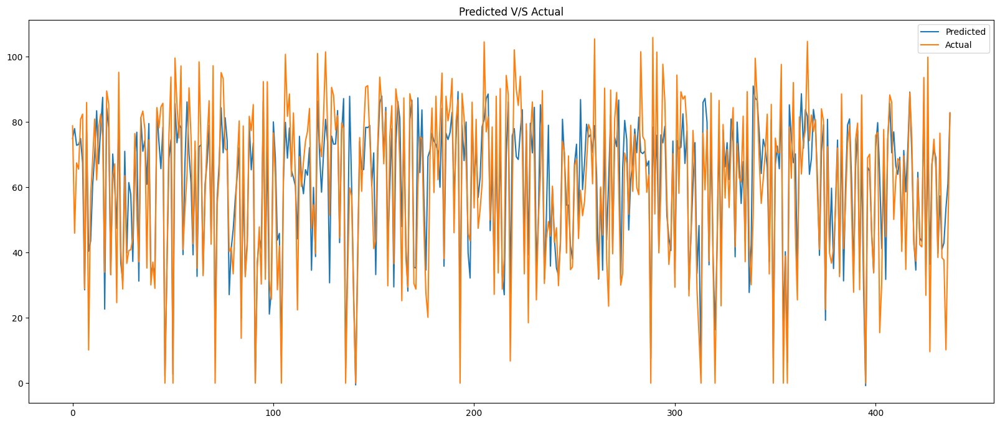

In [91]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

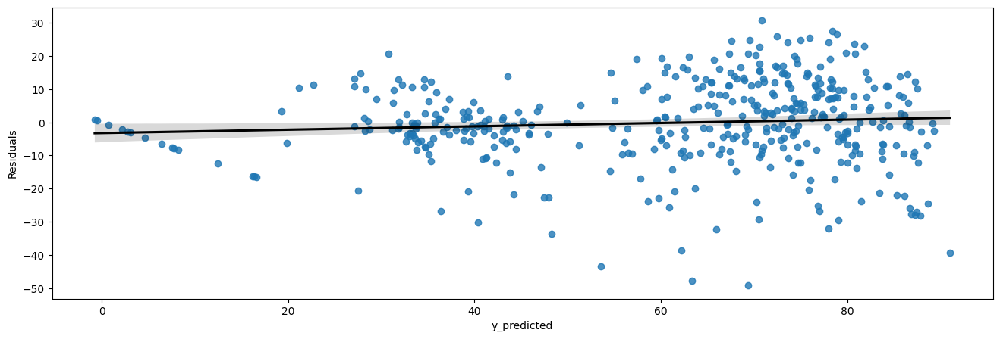

In [92]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

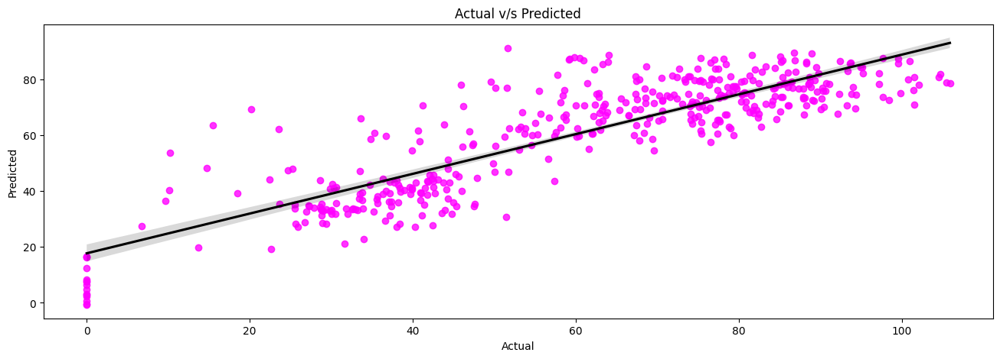

In [93]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

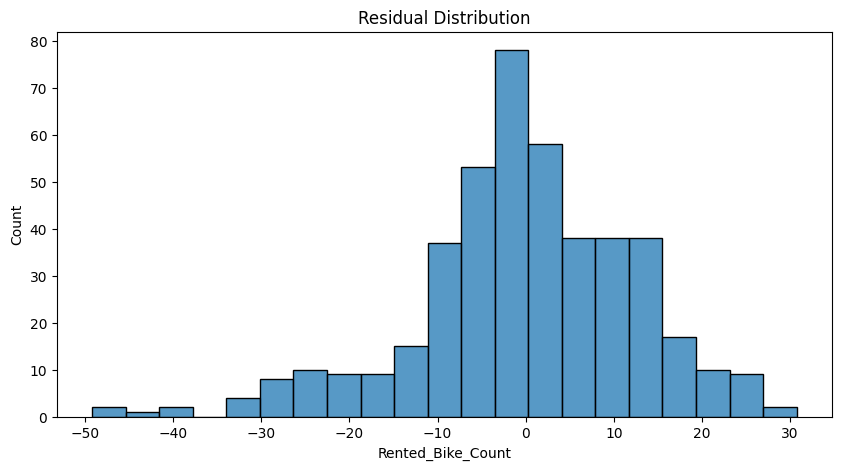

In [94]:
Residual_histPlot(y_pred,y_test)

In [95]:
## saving the model !!
save_model(l_reg,"Linear_Regression_model_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Linear_Regression_model_Time_Interval.pkl


### Lasso

In [96]:
# instantiating
lasso_reg=Lasso(alpha=0.01)

In [97]:
# Fitting and training the model
lasso_reg.fit(X_train,y_train)

Lasso(alpha=0.01)

In [98]:
# Check coefficient
lasso_reg.coef_

array([  7.85285983,  48.78787976,  -0.        ,   1.78503369,
       -73.54240224,  68.55129953,   2.01070768,  -4.50040167,
        -6.70976497,  -7.10734457,  -5.96489867, -21.21166327])

In [99]:
# get dataframe of x columns and Coeficients
pd.DataFrame(lasso_reg.coef_,X.columns,columns=['Coeficients']).reset_index().rename(columns={'index':'X'})

,X,Coeficients
0,Time_Interval,7.852860
1,Temperature,48.787880
2,Wind_speed,-0.000000
3,Solar_Radiation,1.785034
4,Rainfall,-73.542402
5,Functioning_Day,68.551300
6,Month,2.010708
7,Weekdays_or_weekend,-4.500402
8,Holiday,-6.709765
9,Seasons_Spring,-7.107345


In [100]:
# Check score on train dataset
print("R2 Score:")
lasso_reg.score(X_train,y_train)

R2 Score:


0.7363408249516914

In [101]:
# Check score on test dataset
lasso_reg.score(X_test,y_test)

0.744430646023961

In [102]:
# Check intercept
lasso_reg.intercept_

-27.34753202256774

In [103]:
# y prdiction on train data
y_pred_train=lasso_reg.predict(X_train)
# y prdiction on test data
y_pred=lasso_reg.predict(X_test)

### Evaluation On Train Data.

In [104]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 9.467084725215996.
The Mean Squred Error(MSE) is 166.4384709580967.
The Root Mean Squared Error(RMSE) is 12.901103478311331.
The R2 Score is 0.7363408249516914.


In [105]:
# Create train results dictionary
train_dict={'Model':"Lasoo",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [106]:

# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4622,166.4069,12.8999,0.7364
1,Lasoo,9.4671,166.4385,12.9011,0.7363


### Evaluation On Test Data.

In [107]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 9.504491557300367.
 The Mean Squred Error(MSE) is 159.02617954422655.
The Root Mean Squared Error(RMSE) is 12.61055825664457.
The R2 Score is 0.744430646023961.


In [108]:

# Create test results dictionary
test_dict={'Model':"Lasso",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [109]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4884,158.7811,12.6008,0.7448
1,Lasso,9.5045,159.0262,12.6106,0.7444


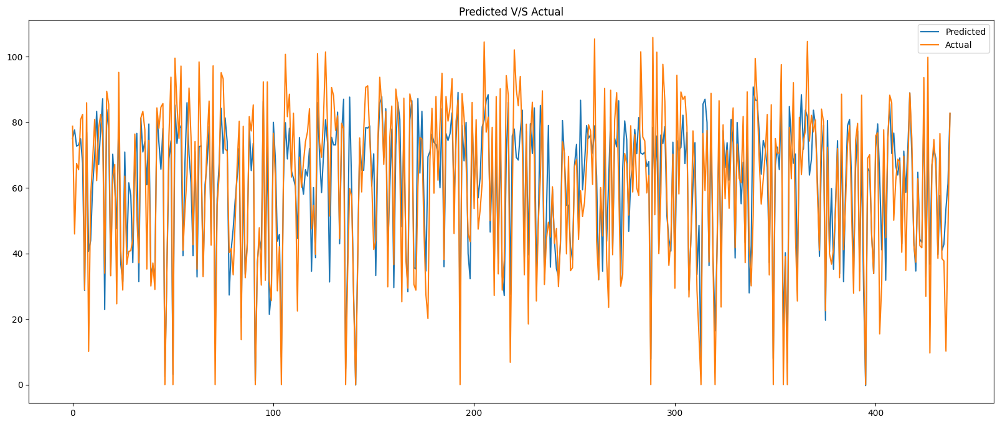

In [110]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

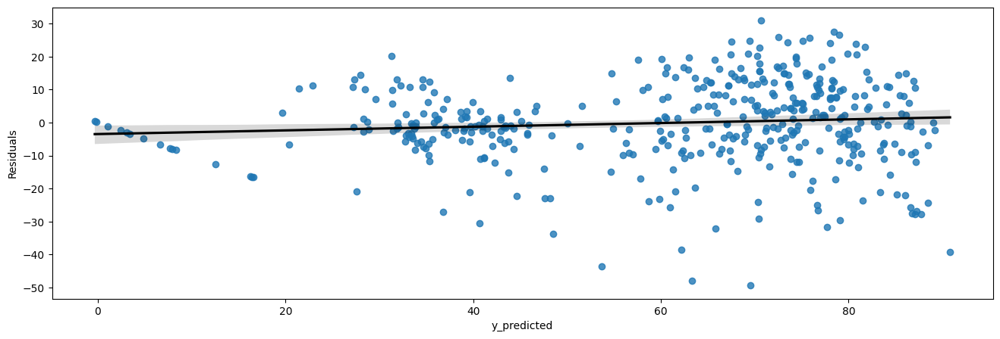

In [111]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

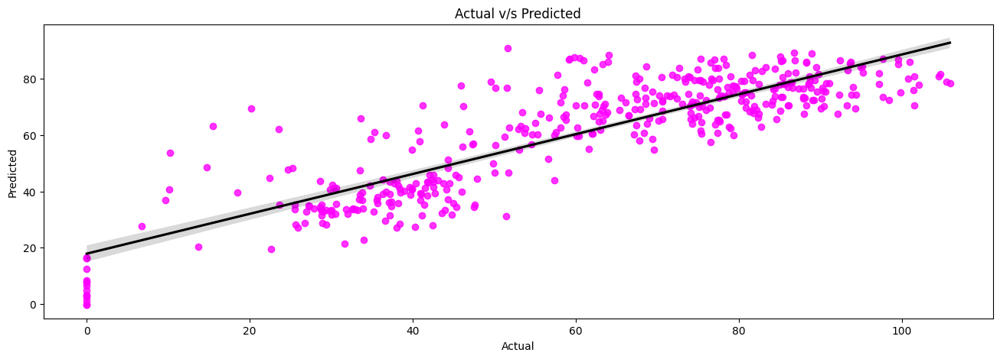

In [112]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

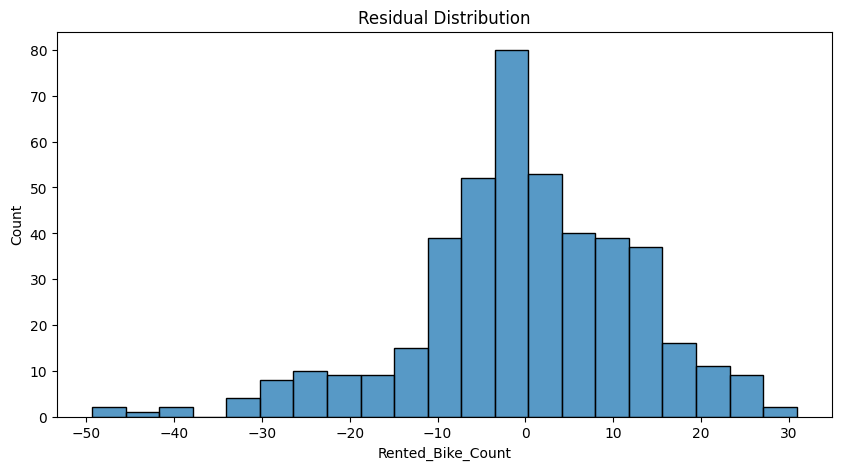

In [113]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)

Residual_histPlot(y_pred,y_test)

In [114]:
save_model(lasso_reg,"Lasso_Regression_model_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Lasso_Regression_model_Time_Interval.pkl


# Ridge

In [115]:
# instantiating
ridge_lg=Ridge(alpha=0.1)
# fitting and training
ridge_lg.fit(X_train,y_train)

Ridge(alpha=0.1)

In [116]:
# check coefficient
ridge_lg.coef_

array([  7.99774096,  49.0654474 ,  -0.19721434,   2.07708441,
       -73.66719396,  68.75356664,   2.00813949,  -4.55826257,
        -6.92189305,  -7.27441048,  -6.2173043 , -21.2380661 ])

In [117]:
# get dataframe for x columns and coeff
pd.DataFrame(ridge_lg.coef_,X.columns,columns=['Coefficients'])

,Coefficients
Time_Interval,7.997741
Temperature,49.065447
Wind_speed,-0.197214
Solar_Radiation,2.077084
Rainfall,-73.667194
Functioning_Day,68.753567
Month,2.008139
Weekdays_or_weekend,-4.558263
Holiday,-6.921893
Seasons_Spring,-7.274410


In [118]:
# Check intercept
ridge_lg.intercept_

-27.623265338583742

In [119]:
# y predictions on training dataset
y_pred_train_ridge=ridge_lg.predict(X_train)
# y predictions on test dataset
y_pred_ridge=ridge_lg.predict(X_test)

### Evaluation On Train Data.

In [120]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 9.467084725215996.
The Mean Squred Error(MSE) is 166.4384709580967.
The Root Mean Squared Error(RMSE) is 12.901103478311331.
The R2 Score is 0.7363408249516914.


In [121]:
train_dict={'Model':"Ridge",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}



In [122]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df



,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4622,166.4069,12.8999,0.7364
1,Lasoo,9.4671,166.4385,12.9011,0.7363
2,Ridge,9.4671,166.4385,12.9011,0.7363


### Evaluation On Test Data.

In [123]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 9.504491557300367.
 The Mean Squred Error(MSE) is 159.02617954422655.
The Root Mean Squared Error(RMSE) is 12.61055825664457.
The R2 Score is 0.744430646023961.


In [124]:
test_dict={'Model':"Ridge",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [125]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4884,158.7811,12.6008,0.7448
1,Lasso,9.5045,159.0262,12.6106,0.7444
2,Ridge,9.5045,159.0262,12.6106,0.7444


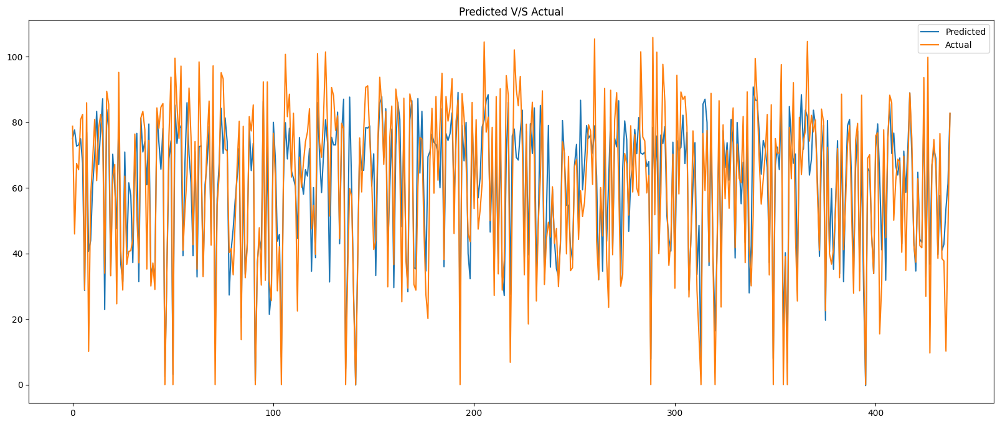

In [126]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

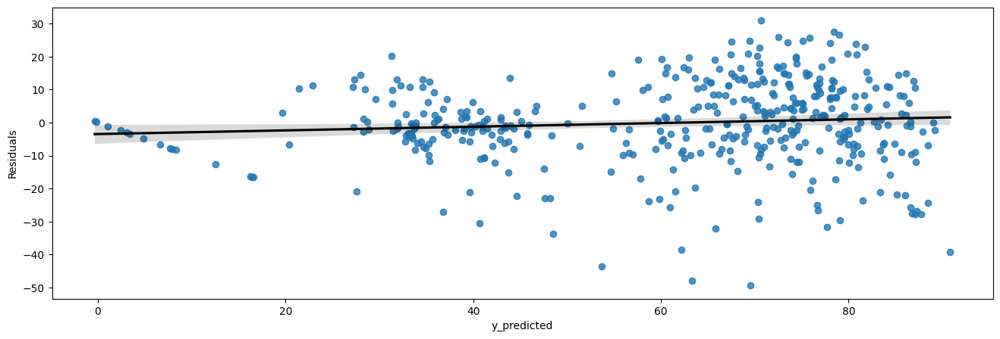

In [127]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

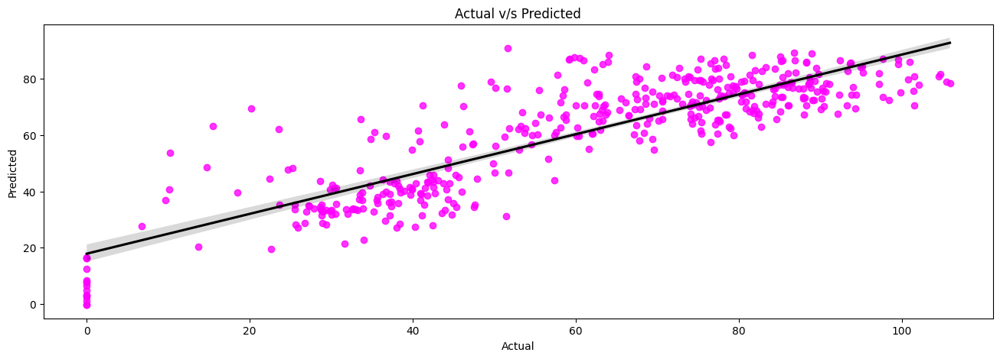

In [128]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

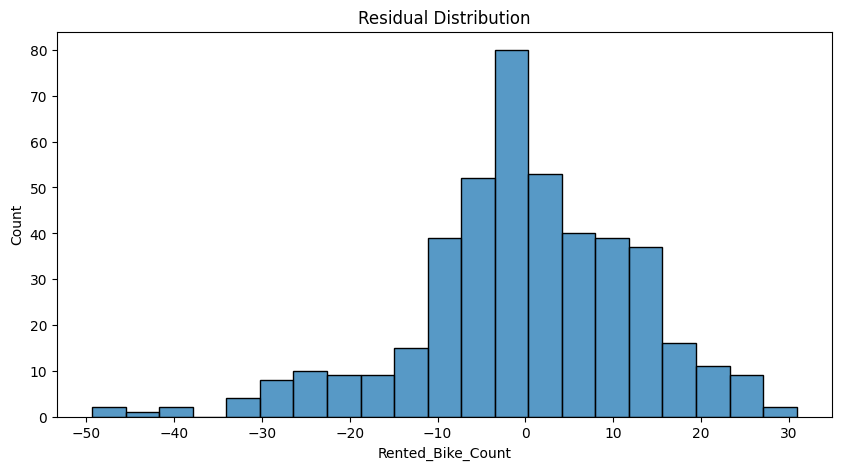

In [129]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)
Residual_histPlot(y_pred,y_test)

* Here, α (alpha) is the parameter which balances the amount of emphasis given to minimizing RSS vs minimizing sum of square of coefficients. α can take various values:

* α = 0:
The objective becomes same as simple linear regression.
We’ll get the same coefficients as simple linear regression.
* α = ∞:
The coefficients will be zero. Why? Because of infinite weightage on square of coefficients, anything less than zero will make the objective infinite.
* 0 < α < ∞:
The magnitude of α will decide the weightage given to different parts of objective.
The coefficients will be somewhere between 0 and ones for simple linear regression.

In [130]:
save_model(ridge_lg,"Ridge_Linear_Regression_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Ridge_Linear_Regression_Time_Interval.pkl


# ElasticNet

In [131]:
# creating object of elastic net
elastic_net_reg=ElasticNet(alpha=0.001,l1_ratio=0.5)
elastic_net_reg.fit(X_train,y_train)

ElasticNet(alpha=0.001)

In [132]:
# Check score on train data
elastic_net_reg.score(X_train,y_train)

0.7360255789489727

In [133]:
# check score on test data
elastic_net_reg.score(X_test,y_test)

0.742680804952453

In [134]:
# predicting Y train values from train data set
y_pred_train=elastic_net_reg.predict(X_train)
# predicting y values from test data
y_pred=elastic_net_reg.predict(X_test)

In [135]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 9.497141791240129.
The Mean Squred Error(MSE) is 166.63747432165704.
The Root Mean Squared Error(RMSE) is 12.90881382318519.
The R2 Score is 0.7360255789489727.


In [136]:
train_dict={'Model':"ElasticNet",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [137]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4622,166.4069,12.8999,0.7364
1,Lasoo,9.4671,166.4385,12.9011,0.7363
2,Ridge,9.4671,166.4385,12.9011,0.7363
3,ElasticNet,9.4971,166.6375,12.9088,0.7360


In [138]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 9.556631839450617.
 The Mean Squred Error(MSE) is 160.11500547770518.
The Root Mean Squared Error(RMSE) is 12.653655814732167.
The R2 Score is 0.742680804952453.


In [139]:
test_dict={'Model':"ElasticNet",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [140]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4884,158.7811,12.6008,0.7448
1,Lasso,9.5045,159.0262,12.6106,0.7444
2,Ridge,9.5045,159.0262,12.6106,0.7444
3,ElasticNet,9.5566,160.1150,12.6537,0.7427


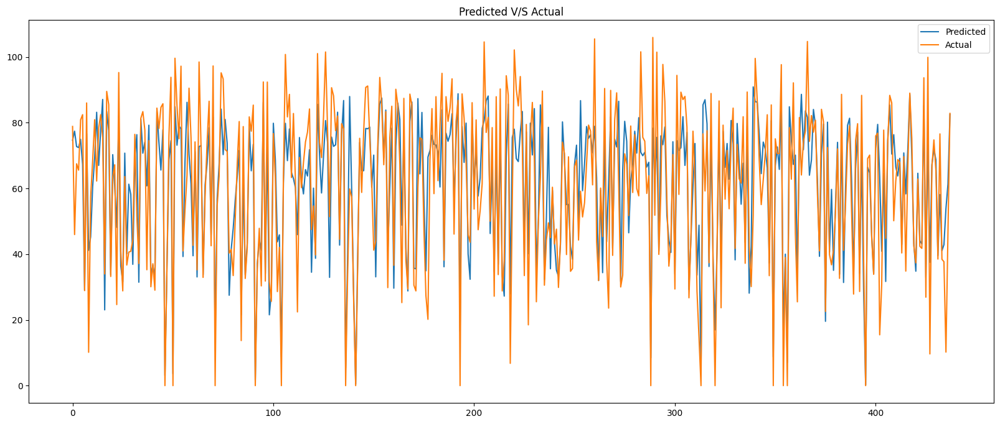

In [141]:
# plotting predicted v/s actual
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

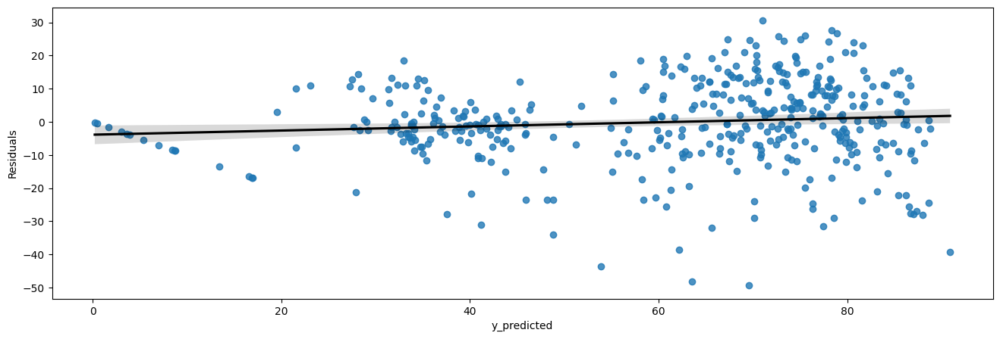

In [142]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

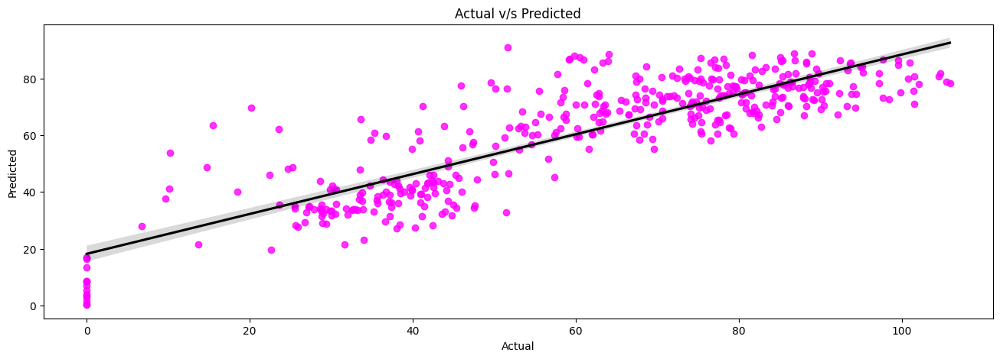

In [143]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

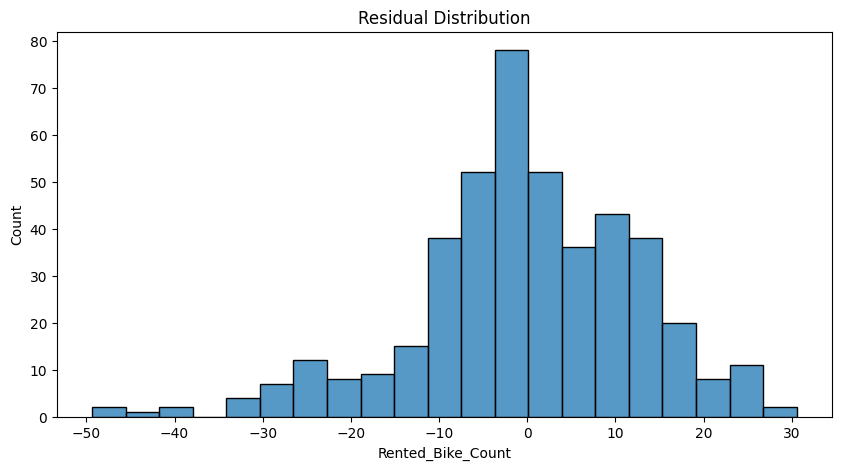

In [144]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)
Residual_histPlot(y_pred,y_test)

In [145]:
print(traing_results_df)
print()
print(test_results_df)

               Model     MAE       MSE     RMSE  R2_score
0  Linear Regression  9.4622  166.4069  12.8999    0.7364
1              Lasoo  9.4671  166.4385  12.9011    0.7363
2              Ridge  9.4671  166.4385  12.9011    0.7363
3         ElasticNet  9.4971  166.6375  12.9088    0.7360

               Model     MAE       MSE     RMSE  R2_score
0  Linear Regression  9.4884  158.7811  12.6008    0.7448
1              Lasso  9.5045  159.0262  12.6106    0.7444
2              Ridge  9.5045  159.0262  12.6106    0.7444
3         ElasticNet  9.5566  160.1150  12.6537    0.7427


In [146]:
save_model(elastic_net_reg,"Linear_Regression_Elastic_net_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Linear_Regression_Elastic_net_Time_Interval.pkl


As We have saw in linear regression,lasso,ridge and elastic net we are getting almost similar R2 scores.

# *Decision Tree Regressor*

In [147]:
# Import decision tree packages
from sklearn.tree import DecisionTreeRegressor

# Create an object
D_tree = DecisionTreeRegressor(max_depth=15, splitter='best', max_features=None)  

# Fitting the model to the training data
D_tree.fit(X_train, y_train)


DecisionTreeRegressor(max_depth=15)

In [148]:
# Check score on Train dataset
D_tree.score(X_train,y_train)

0.9985510671627112

In [149]:
# check score on Test dataset.
D_tree.score(X_test,y_test)

0.841724359459628

In [150]:
#  predicting y_train_predictions from  X train values
y_pred_train=D_tree.predict(X_train)
#  predicting y_predictions from  X test values
y_pred=D_tree.predict(X_test)

In [151]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

# creating dictionary  of Decison tree results( Train dataset)
train_dict={'Model':"Decision Tree Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


The Mean Absolute Error (MAE) is 0.3523082175398542.
The Mean Squred Error(MSE) is 0.9146587290775664.
The Root Mean Squared Error(RMSE) is 0.956377921680319.
The R2 Score is 0.9985510671627112.


In [152]:
# creating dictionary  of Decison tree results( Train dataset)
train_dict={'Model':"Decision Tree Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [153]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4622,166.4069,12.8999,0.7364
1,Lasoo,9.4671,166.4385,12.9011,0.7363
2,Ridge,9.4671,166.4385,12.9011,0.7363
3,ElasticNet,9.4971,166.6375,12.9088,0.7360
4,Decision Tree Regressor,0.3523,0.9147,0.9564,0.9986


In [154]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 6.384544271173918.
 The Mean Squred Error(MSE) is 98.48587101100742.
The Root Mean Squared Error(RMSE) is 9.924004786929892.
The R2 Score is 0.841724359459628.


In [155]:

test_dict={'Model':"Decision Tree Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [156]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4884,158.7811,12.6008,0.7448
1,Lasso,9.5045,159.0262,12.6106,0.7444
2,Ridge,9.5045,159.0262,12.6106,0.7444
3,ElasticNet,9.5566,160.1150,12.6537,0.7427
4,Decision Tree Regressor,6.3845,98.4859,9.9240,0.8417


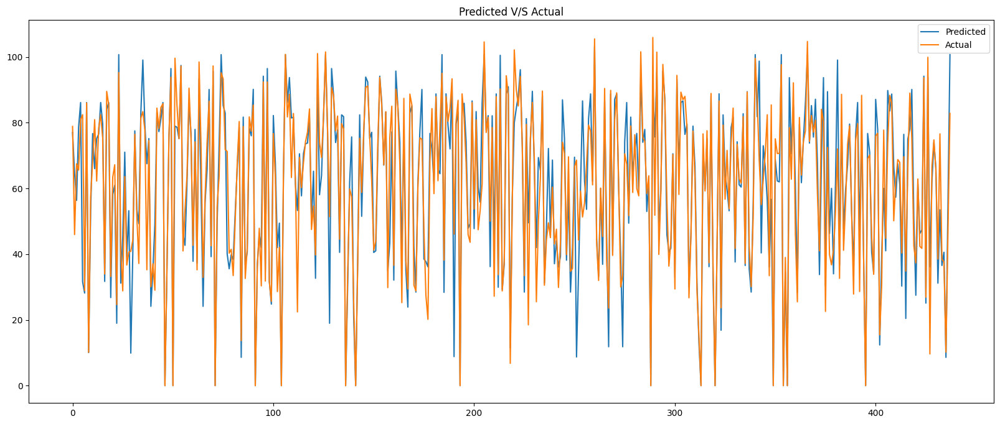

In [157]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

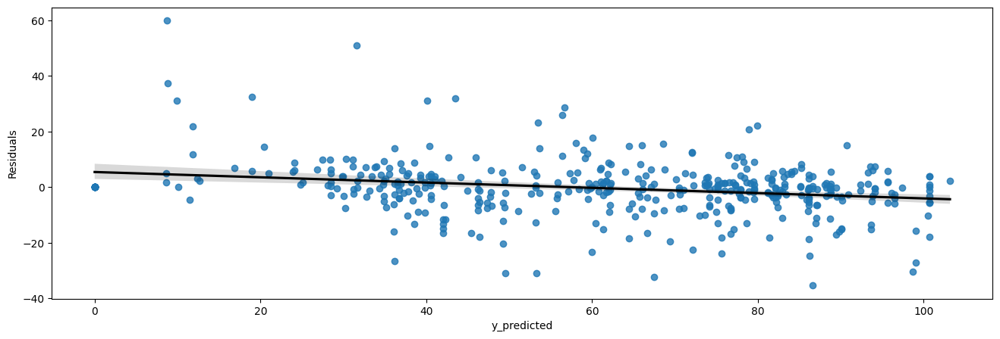

In [158]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

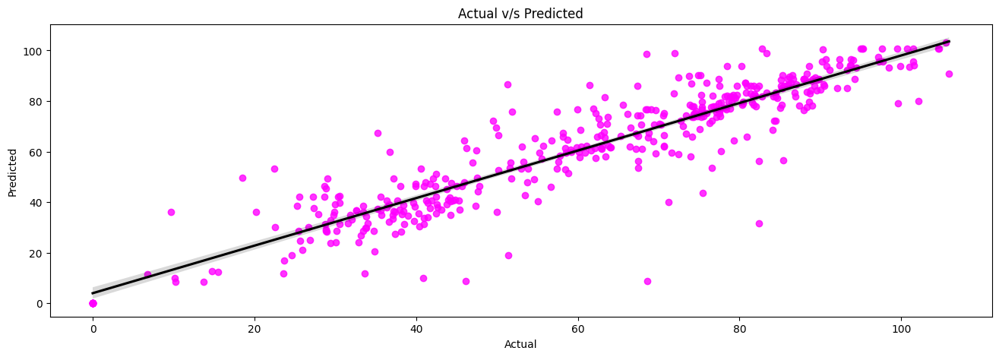

In [159]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

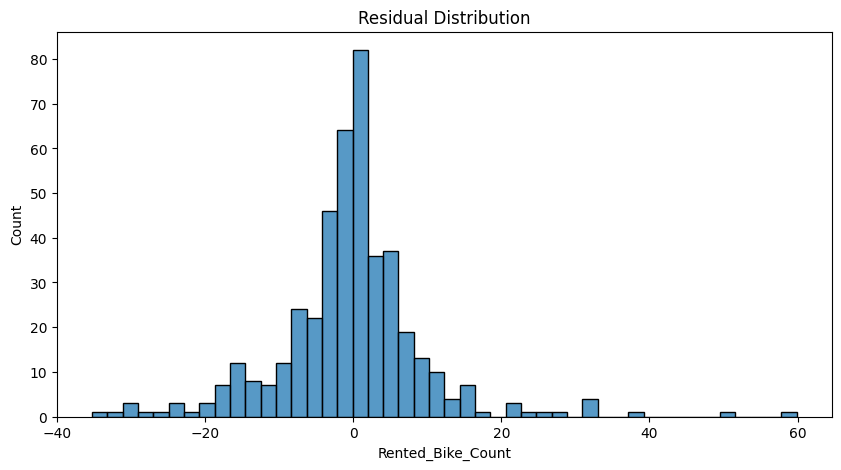

In [160]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)
Residual_histPlot(y_pred,y_test)

In [161]:
save_model(D_tree,"Decision_Tree_Regressor_model_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Decision_Tree_Regressor_model_Time_Interval.pkl


# Hyperparameter Tuning

In [162]:
from sklearn.model_selection import GridSearchCV

In [163]:
# Hyper parameters range intialization for tuning 
tree=DecisionTreeRegressor()
parameters={'criterion': ["absolute_error"],
            "splitter":["best","random"],
            "max_depth" : [3,5,7,9],
           "max_features":["auto","log2"] }

In [164]:
tuning_model=GridSearchCV(tree,param_grid=parameters,scoring='neg_mean_squared_error',cv=5) 
tuning_model.fit(X_train,y_train)

/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
40 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/base.py", line 666, in _validate_params

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['absolute_error'],
                         'max_depth': [3, 5, 7, 9],
                         'max_features': ['auto', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error')

In [165]:
tuning_model.best_params_

{'criterion': 'absolute_error',
 'max_depth': 9,
 'max_features': 'log2',
 'splitter': 'best'}

In [166]:
D_tree=DecisionTreeRegressor(criterion='absolute_error',max_depth=9,max_features='log2',splitter='best')
D_tree.fit(X_train,y_train)

DecisionTreeRegressor(criterion='absolute_error', max_depth=9,
                      max_features='log2')

In [167]:
#  predicting y_train_predictions from  X train values
y_pred_train=D_tree.predict(X_train)
#  predicting y_predictions from  X test values
y_pred=D_tree.predict(X_test)

In [168]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

# creating dictionary  of Decison tree results( Train dataset)
train_dict={'Model':"Decision Tree Best Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df


The Mean Absolute Error (MAE) is 4.557644625661636.
The Mean Squred Error(MSE) is 56.105043387618544.
The Root Mean Squared Error(RMSE) is 7.490329991904131.
The R2 Score is 0.9111226546934974.


,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4622,166.4069,12.8999,0.7364
1,Lasoo,9.4671,166.4385,12.9011,0.7363
2,Ridge,9.4671,166.4385,12.9011,0.7363
3,ElasticNet,9.4971,166.6375,12.9088,0.7360
4,Decision Tree Regressor,0.3523,0.9147,0.9564,0.9986
5,Decision Tree Best Regressor,4.5576,56.1050,7.4903,0.9111


In [169]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")


test_dict={'Model':"Decision Tree Best Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df


 The Mean Absolute Error (MAE) is 7.833718969199766.
 The Mean Squred Error(MSE) is 133.92991250575807.
The Root Mean Squared Error(RMSE) is 11.572809188168534.
The R2 Score is 0.7847626012568276.


,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4884,158.7811,12.6008,0.7448
1,Lasso,9.5045,159.0262,12.6106,0.7444
2,Ridge,9.5045,159.0262,12.6106,0.7444
3,ElasticNet,9.5566,160.1150,12.6537,0.7427
4,Decision Tree Regressor,6.3845,98.4859,9.9240,0.8417
5,Decision Tree Best Regressor,7.8337,133.9299,11.5728,0.7848


Text(0.5, 0, 'Relative Importance')

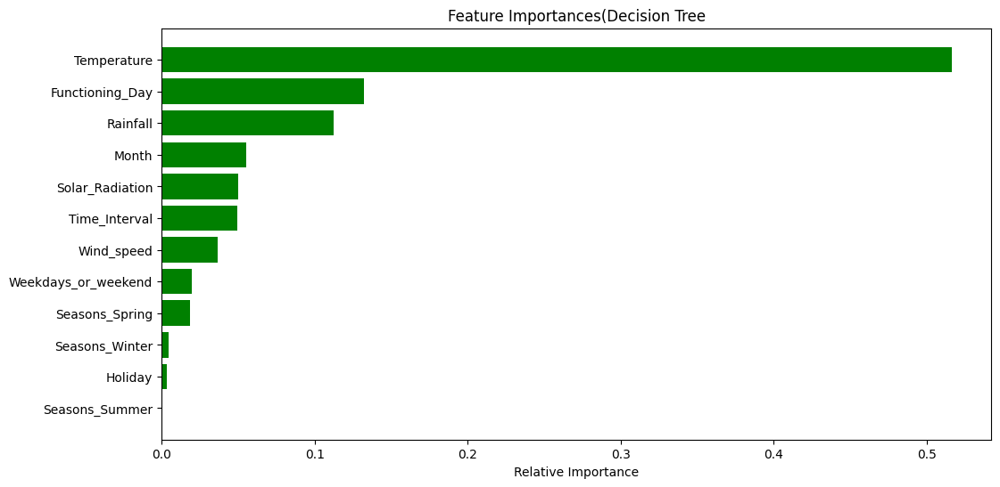

In [170]:
imp_variables=X.columns
importances = D_tree.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12,6))
plt.title('Feature Importances(Decision Tree')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), imp_variables[indices])
plt.xlabel('Relative Importance')

We have applied this best parameters to above Decsion tree regressor model

In [171]:
save_model(tuning_model,"Decision_Tree_Best_Regressor_model_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Decision_Tree_Best_Regressor_model_Time_Interval.pkl


### Random Forest Regressor

In [172]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(X_train,y_train)

RandomForestRegressor()

In [173]:
rf.score(X_train,y_train)

0.9861991640151242

In [174]:
rf.score(X_test,y_test)

0.9157810683971775

In [175]:
y_pred_train=rf.predict(X_train)
y_pred=rf.predict(X_test)

In [176]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 1.9287228613805463.
The Mean Squred Error(MSE) is 8.711967026542288.
The Root Mean Squared Error(RMSE) is 2.951604144620733.
The R2 Score is 0.9861991640151242.


In [177]:
train_dict={'Model':"Random Forest",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [178]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4622,166.4069,12.8999,0.7364
1,Lasoo,9.4671,166.4385,12.9011,0.7363
2,Ridge,9.4671,166.4385,12.9011,0.7363
3,ElasticNet,9.4971,166.6375,12.9088,0.7360
4,Decision Tree Regressor,0.3523,0.9147,0.9564,0.9986
5,Decision Tree Best Regressor,4.5576,56.1050,7.4903,0.9111
6,Random Forest,1.9287,8.7120,2.9516,0.9862


In [179]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 4.971361261296202.
 The Mean Squred Error(MSE) is 52.40462023216231.
The Root Mean Squared Error(RMSE) is 7.239103551694941.
The R2 Score is 0.9157810683971775.


In [180]:
test_dict={'Model':"Radom forest",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [181]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4884,158.7811,12.6008,0.7448
1,Lasso,9.5045,159.0262,12.6106,0.7444
2,Ridge,9.5045,159.0262,12.6106,0.7444
3,ElasticNet,9.5566,160.1150,12.6537,0.7427
4,Decision Tree Regressor,6.3845,98.4859,9.9240,0.8417
5,Decision Tree Best Regressor,7.8337,133.9299,11.5728,0.7848
6,Radom forest,4.9714,52.4046,7.2391,0.9158


In [182]:
save_model(rf,"Random_Forest_Regressor_model_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Random_Forest_Regressor_model_Time_Interval.pkl


### Hyper Parameter On random Forest

In [183]:
param={'n_estimators':[25,50,40,80,100],'max_depth':[3,4,5,6,7,8,9]}

In [184]:
rf_reg=RandomForestRegressor()
rf_tuning=GridSearchCV(rf_reg,param_grid=param,scoring='neg_mean_squared_error',cv=5)
rf_tuning.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9],
                         'n_estimators': [25, 50, 40, 80, 100]},
             scoring='neg_mean_squared_error')

In [185]:
rf_tuning.best_params_

{'max_depth': 9, 'n_estimators': 100}

In [186]:
rf=RandomForestRegressor(max_depth=9,n_estimators=100)
rf.fit(X_train,y_train)

RandomForestRegressor(max_depth=9)

In [187]:

rf.score(X_train,y_train)

0.9644878076574951

In [188]:

rf.score(X_test,y_test)

0.9036910686315712

In [189]:
y_pred_train=rf.predict(X_train)
y_pred=rf.predict(X_test)

In [190]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 3.4818311278832104.
The Mean Squred Error(MSE) is 22.417558549871774.
The Root Mean Squared Error(RMSE) is 4.734718423504377.
The R2 Score is 0.9644878076574951.


In [191]:
train_dict={'Model':"Random Forest-GridSearchCv",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}



In [192]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4622,166.4069,12.8999,0.7364
1,Lasoo,9.4671,166.4385,12.9011,0.7363
2,Ridge,9.4671,166.4385,12.9011,0.7363
3,ElasticNet,9.4971,166.6375,12.9088,0.7360
4,Decision Tree Regressor,0.3523,0.9147,0.9564,0.9986
5,Decision Tree Best Regressor,4.5576,56.1050,7.4903,0.9111
6,Random Forest,1.9287,8.7120,2.9516,0.9862
7,Random Forest-GridSearchCv,3.4818,22.4176,4.7347,0.9645


In [193]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 5.383531692678265.
 The Mean Squred Error(MSE) is 59.92753502418866.
The Root Mean Squared Error(RMSE) is 7.741287685145712.
The R2 Score is 0.9036910686315712.


In [194]:
test_dict={'Model':"Random Forest-GridSearchCv",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [195]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,9.4884,158.7811,12.6008,0.7448
1,Lasso,9.5045,159.0262,12.6106,0.7444
2,Ridge,9.5045,159.0262,12.6106,0.7444
3,ElasticNet,9.5566,160.1150,12.6537,0.7427
4,Decision Tree Regressor,6.3845,98.4859,9.9240,0.8417
5,Decision Tree Best Regressor,7.8337,133.9299,11.5728,0.7848
6,Radom forest,4.9714,52.4046,7.2391,0.9158
7,Random Forest-GridSearchCv,5.3835,59.9275,7.7413,0.9037


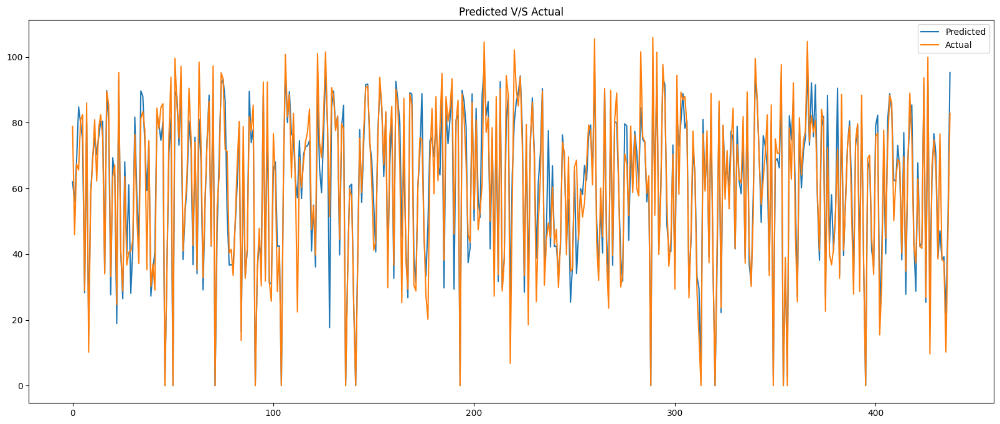

In [196]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

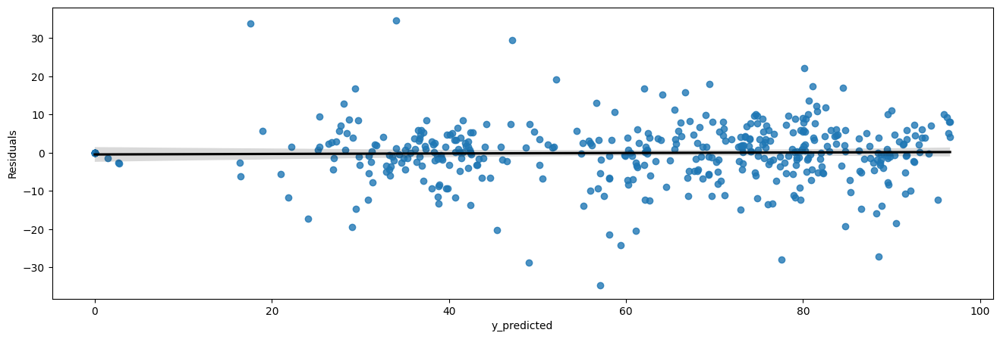

In [197]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

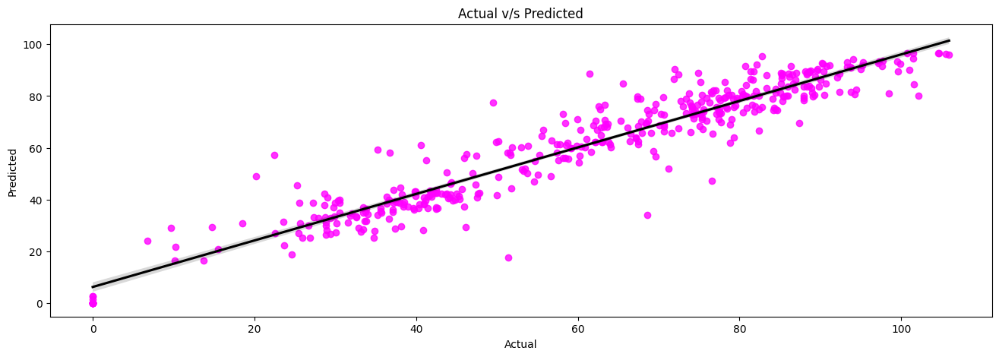

In [198]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

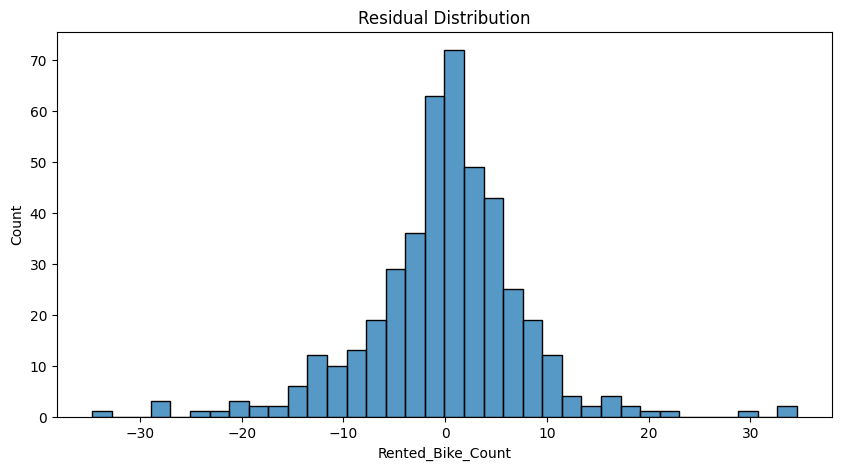

In [199]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)

Residual_histPlot(y_pred,y_test)

Text(0.5, 0, 'Relative Importance')

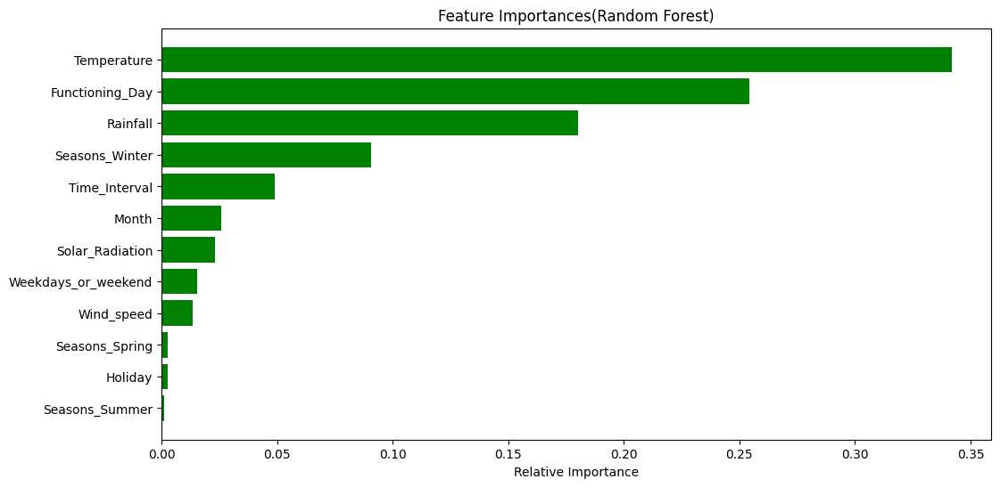

In [200]:
imp_variables=X.columns
importances = rf.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12,6))
plt.title('Feature Importances(Random Forest)')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), imp_variables[indices])
plt.xlabel('Relative Importance')

In [201]:
save_model(rf_tuning,"Random_Forest_GridSearchCV_Time_Interval.pkl")

Model saved to /Users/mayankkumar/Documents/ML_PROJECT_CODE/save_model/Random_Forest_GridSearchCV_Time_Interval.pkl


### Key Predictors:

Temperature: This is the most important feature, which makes sense because bike rentals are often correlated with favorable weather conditions.
Functioning_Day: High importance indicates that whether it's a functioning day (likely meaning working day vs. non-working day) significantly impacts bike rental counts.
Rainfall: Rainy conditions are understandably a strong determinant of bike usage, as people are less likely to rent bikes during rain.
Moderately Important Features:

Seasons_Winter: This shows that seasonality affects bike rentals, with winter possibly seeing reduced rentals compared to other seasons.
Time_Interval: The time of day impacts rental patterns, likely reflecting commuting or leisure trends.
Lesser Impact Features:

Month and Solar_Radiation: These are less significant but could indicate long-term patterns or daylight availability.
Weekdays_or_weekend: Differentiating between weekdays and weekends has some effect but is not as prominent as expected.
Wind_speed: This could mildly influence comfort levels for biking.
Negligible Features:

Seasons_Spring, Holiday, Seasons_Summer: These have minimal impact, suggesting they may either have limited variation or are not as strongly related to bike rentals as the other factors.
Insights & Recommendations:
The dominance of temperature, rainfall, and functioning day suggests that weather and work schedules are critical to your model. You could investigate these factors further, potentially with lag or lead effects (e.g., how yesterday's weather might impact today’s rentals).
Seasonal features seem underutilized. If your data spans multiple years, you might explore whether yearly trends (e.g., holidays or specific seasons) carry more weight.
Since Time_Interval has moderate importance, you could evaluate its interactions with other variables (e.g., temperature during peak hours) for further refinement.

#### Conclusions:

* #### As we have calculated MAE,MSE,RMSE and R2 score for each model. Based on r2 score will decide our model performance.
* #### Our assumption: if the differnece of R2 score between Train data and Test is more than 5 % we will consider it as overfitting. 

# Linear,Lasso,Ridge and ElasticNet.

>* #### 1)From The above data frame, we can see that linear,Lasso,Ridge  and Elastic  regression models have almost similar R2 scores(61%) on both training and test data.
 
# Decision Tree Regressor:
> * #### On Decision tree regressor model, without hyperparameter tuning we got R2 score as 98.6% on training data and on test data it was very less 86% . Thus our model memorised the data.So it was a overfitted model.
* #### After hyperparameter tuning we got R2 score as 76% on training data and 74% on test data which is quite good for us.

# Random Forest:

> * #### On Random Forest regressor model, without hyperparameter tuning we got r2 score as 98% on training data and 90% on test data. Thus our model memorised the data.So it was a overfitted model, as per our assumption
* #### After hyperparameter tuning we got R2 score as 91% on training data and 88% on test data which is  very good for us.

> * ## Random forest(gridSearchCv) gives good r2 scores. We can deploy this model.

### In terms of features, Temperature and Hours plays very important role in 3 models. Other features importances are different in 3 models.